In [252]:
import warnings

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.graph_objects as go
import plotly.io as pio
import ruptures as rpt
import statsmodels.api as sm
from arch import arch_model
from dieboldmariano import dm_test
from loess import loess_1d
from plotly.subplots import make_subplots
from pmdarima import auto_arima
from scipy.interpolate import BSpline, splrep
from scipy.stats import linregress
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.holtwinters import Holt, SimpleExpSmoothing

pio.renderers.default = "jupyterlab"
warnings.filterwarnings("ignore")

## Task 1

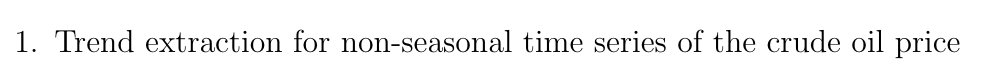

In [253]:
df_crude_oil = pd.read_csv("CrudeOil.csv", parse_dates=["DATE"], index_col="DATE")
df_crude_oil = df_crude_oil.asfreq("D")
df_crude_oil["DCOILBRENTEU"] = df_crude_oil["DCOILBRENTEU"].interpolate()
df_crude_oil = df_crude_oil.iloc[2:]

df_crude_oil

,DCOILBRENTEU
DATE,
2009-01-08,42.940000
2009-01-09,42.340000
2009-01-10,41.846667
2009-01-11,41.353333
2009-01-12,40.860000
...,...
2018-12-31,52.664000
2019-01-01,53.362000
2019-01-02,54.060000


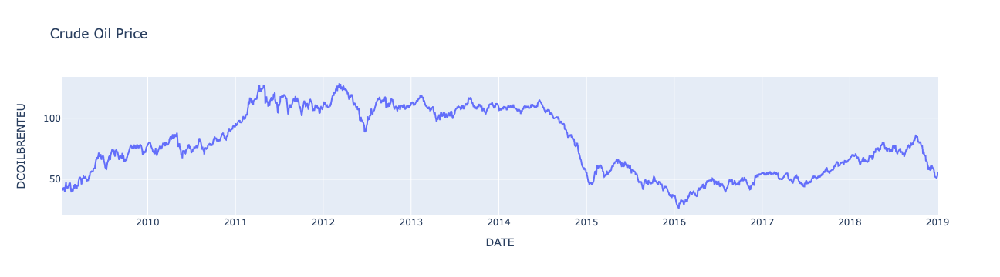

In [254]:
fig = go.Figure()
fig.update_layout(
    title="Crude Oil Price", xaxis_title="DATE", yaxis_title="DCOILBRENTEU"
)
fig.add_trace(
    go.Scatter(
        x=df_crude_oil.index,
        y=df_crude_oil["DCOILBRENTEU"],
        mode="lines",
        name="Crude Oil Price",
    )
)
fig.show()

### a)
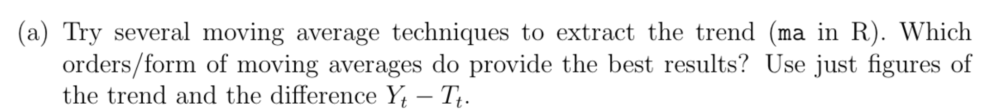

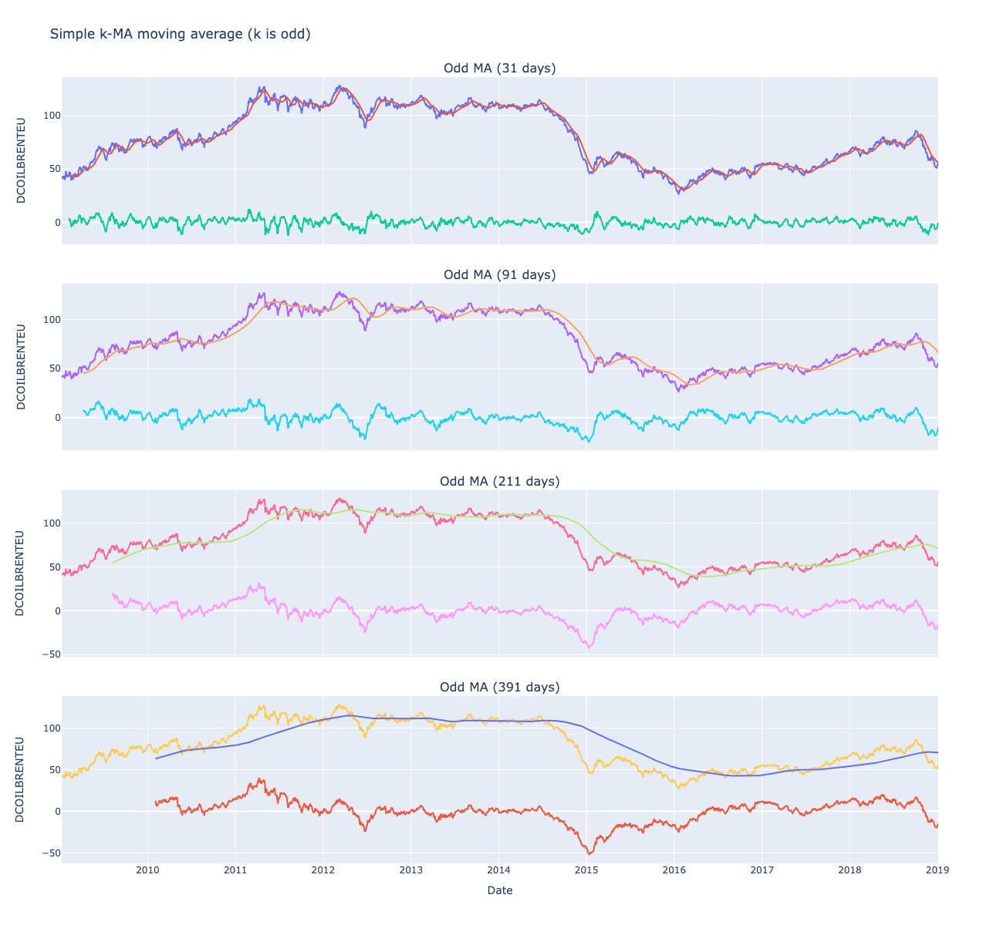

In [255]:
odd_ma_31 = df_crude_oil["DCOILBRENTEU"].rolling(window=31).mean()
odd_ma_91 = df_crude_oil["DCOILBRENTEU"].rolling(window=91).mean()
odd_ma_211 = df_crude_oil["DCOILBRENTEU"].rolling(window=211).mean()
odd_ma_391 = df_crude_oil["DCOILBRENTEU"].rolling(window=391).mean()

fig_odd = make_subplots(
    rows=4,
    cols=1,
    shared_xaxes=True,
    vertical_spacing=0.05,
    subplot_titles=(
        "Odd MA (31 days)",
        "Odd MA (91 days)",
        "Odd MA (211 days)",
        "Odd MA (391 days)",
    ),
)

fig_odd.add_trace(
    go.Scatter(
        x=df_crude_oil.index,
        y=df_crude_oil["DCOILBRENTEU"],
        mode="lines",
        name="Original",
    ),
    row=1,
    col=1,
)
fig_odd.add_trace(
    go.Scatter(
        x=df_crude_oil.index, y=odd_ma_31, mode="lines", name="Odd MA (31 days)"
    ),
    row=1,
    col=1,
)
fig_odd.add_trace(
    go.Scatter(
        x=df_crude_oil.index,
        y=df_crude_oil["DCOILBRENTEU"] - odd_ma_31,
        mode="lines",
        name="Yt - Tt (31 days)",
    ),
    row=1,
    col=1,
)

fig_odd.add_trace(
    go.Scatter(
        x=df_crude_oil.index,
        y=df_crude_oil["DCOILBRENTEU"],
        mode="lines",
        name="Original",
    ),
    row=2,
    col=1,
)
fig_odd.add_trace(
    go.Scatter(
        x=df_crude_oil.index, y=odd_ma_91, mode="lines", name="Odd MA (91 days)"
    ),
    row=2,
    col=1,
)
fig_odd.add_trace(
    go.Scatter(
        x=df_crude_oil.index,
        y=df_crude_oil["DCOILBRENTEU"] - odd_ma_91,
        mode="lines",
        name="Yt - Tt (91 days)",
    ),
    row=2,
    col=1,
)

fig_odd.add_trace(
    go.Scatter(
        x=df_crude_oil.index,
        y=df_crude_oil["DCOILBRENTEU"],
        mode="lines",
        name="Original",
    ),
    row=3,
    col=1,
)
fig_odd.add_trace(
    go.Scatter(
        x=df_crude_oil.index, y=odd_ma_211, mode="lines", name="Odd MA (211 days)"
    ),
    row=3,
    col=1,
)
fig_odd.add_trace(
    go.Scatter(
        x=df_crude_oil.index,
        y=df_crude_oil["DCOILBRENTEU"] - odd_ma_211,
        mode="lines",
        name="Yt - Tt (211 days)",
    ),
    row=3,
    col=1,
)

fig_odd.add_trace(
    go.Scatter(
        x=df_crude_oil.index,
        y=df_crude_oil["DCOILBRENTEU"],
        mode="lines",
        name="Original",
    ),
    row=4,
    col=1,
)
fig_odd.add_trace(
    go.Scatter(
        x=df_crude_oil.index, y=odd_ma_391, mode="lines", name="Odd MA (391 days)"
    ),
    row=4,
    col=1,
)
fig_odd.add_trace(
    go.Scatter(
        x=df_crude_oil.index,
        y=df_crude_oil["DCOILBRENTEU"] - odd_ma_391,
        mode="lines",
        name="Yt - Tt (391 days)",
    ),
    row=4,
    col=1,
)

fig_odd.update_layout(
    height=1200,
    width=800,
    title_text="Simple k-MA moving average (k is odd)",
    showlegend=False,
)
fig_odd.update_yaxes(title_text="DCOILBRENTEU", row=1, col=1)
fig_odd.update_yaxes(title_text="DCOILBRENTEU", row=2, col=1)
fig_odd.update_yaxes(title_text="DCOILBRENTEU", row=3, col=1)
fig_odd.update_yaxes(title_text="DCOILBRENTEU", row=4, col=1)
fig_odd.update_xaxes(title_text="Date", row=4, col=1)

fig_odd.show()

**Comments:**

Let's look at the results here:

31 days - bad trend, as it just makes values more smooth, but still follows every spike in the data.

91 days - bad trend, as  it still captures some spikes in the data. We can see that there are some delay between trend change and actual graph, which are also visible in the later graphs.

211 days - bad trend, as this delay simply makes trend a bit late, but the spikes are covered really good.

391 days - bad trend, as it ignores many information (too smooth) along with having delay in trend change.

Finally, we can see that 211 days (~7months) showed the best trend of all others, but still not perfectly covered (delay) the trend changes.

### b)
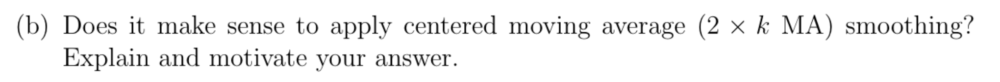

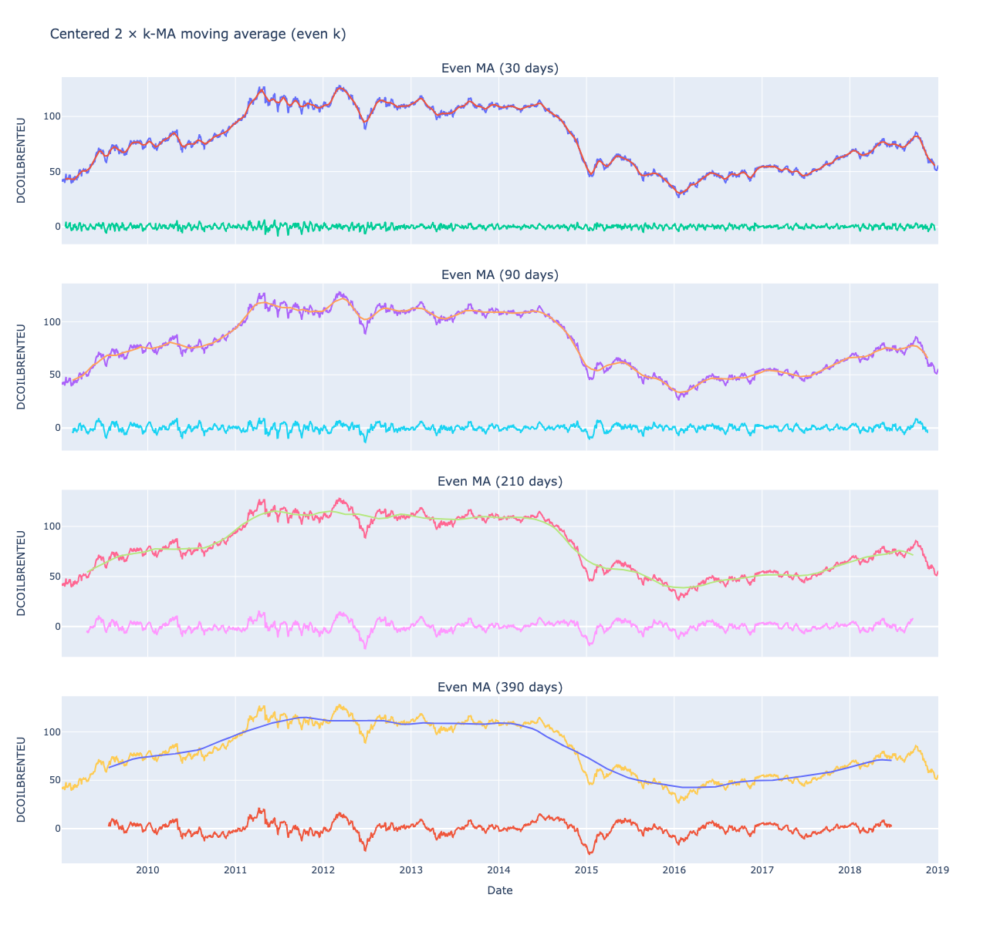

In [256]:
even_ma_30 = df_crude_oil["DCOILBRENTEU"].rolling(window=30, center=True).mean()
even_ma_90 = df_crude_oil["DCOILBRENTEU"].rolling(window=90, center=True).mean()
even_ma_210 = df_crude_oil["DCOILBRENTEU"].rolling(window=210, center=True).mean()
even_ma_390 = df_crude_oil["DCOILBRENTEU"].rolling(window=390, center=True).mean()

fig_even = make_subplots(
    rows=4,
    cols=1,
    shared_xaxes=True,
    vertical_spacing=0.05,
    subplot_titles=(
        "Even MA (30 days)",
        "Even MA (90 days)",
        "Even MA (210 days)",
        "Even MA (390 days)",
    ),
)

fig_even.add_trace(
    go.Scatter(
        x=df_crude_oil.index,
        y=df_crude_oil["DCOILBRENTEU"],
        mode="lines",
        name="Original",
    ),
    row=1,
    col=1,
)
fig_even.add_trace(
    go.Scatter(
        x=df_crude_oil.index, y=even_ma_30, mode="lines", name="Even MA (30 days)"
    ),
    row=1,
    col=1,
)
fig_even.add_trace(
    go.Scatter(
        x=df_crude_oil.index,
        y=df_crude_oil["DCOILBRENTEU"] - even_ma_30,
        mode="lines",
        name="Yt - Tt (30 days)",
    ),
    row=1,
    col=1,
)

fig_even.add_trace(
    go.Scatter(
        x=df_crude_oil.index,
        y=df_crude_oil["DCOILBRENTEU"],
        mode="lines",
        name="Original",
    ),
    row=2,
    col=1,
)
fig_even.add_trace(
    go.Scatter(
        x=df_crude_oil.index, y=even_ma_90, mode="lines", name="Even MA (90 days)"
    ),
    row=2,
    col=1,
)
fig_even.add_trace(
    go.Scatter(
        x=df_crude_oil.index,
        y=df_crude_oil["DCOILBRENTEU"] - even_ma_90,
        mode="lines",
        name="Yt - Tt (90 days)",
    ),
    row=2,
    col=1,
)

fig_even.add_trace(
    go.Scatter(
        x=df_crude_oil.index,
        y=df_crude_oil["DCOILBRENTEU"],
        mode="lines",
        name="Original",
    ),
    row=3,
    col=1,
)
fig_even.add_trace(
    go.Scatter(
        x=df_crude_oil.index, y=even_ma_210, mode="lines", name="Even MA (210 days)"
    ),
    row=3,
    col=1,
)
fig_even.add_trace(
    go.Scatter(
        x=df_crude_oil.index,
        y=df_crude_oil["DCOILBRENTEU"] - even_ma_210,
        mode="lines",
        name="Yt - Tt (210 days)",
    ),
    row=3,
    col=1,
)

fig_even.add_trace(
    go.Scatter(
        x=df_crude_oil.index,
        y=df_crude_oil["DCOILBRENTEU"],
        mode="lines",
        name="Original",
    ),
    row=4,
    col=1,
)
fig_even.add_trace(
    go.Scatter(
        x=df_crude_oil.index, y=even_ma_390, mode="lines", name="Even MA (390 days)"
    ),
    row=4,
    col=1,
)
fig_even.add_trace(
    go.Scatter(
        x=df_crude_oil.index,
        y=df_crude_oil["DCOILBRENTEU"] - even_ma_390,
        mode="lines",
        name="Yt - Tt (390 days)",
    ),
    row=4,
    col=1,
)

fig_even.update_layout(
    height=1200,
    width=800,
    title_text="Centered 2 × k-MA moving average (even k)",
    showlegend=False,
)
fig_even.update_yaxes(title_text="DCOILBRENTEU", row=1, col=1)
fig_even.update_yaxes(title_text="DCOILBRENTEU", row=2, col=1)
fig_even.update_yaxes(title_text="DCOILBRENTEU", row=3, col=1)
fig_even.update_yaxes(title_text="DCOILBRENTEU", row=4, col=1)
fig_even.update_xaxes(title_text="Date", row=4, col=1)

fig_even.show()

**Comments:**

It makes sense to apply centered moving average as the simple average cannot fully capture the trend change. And centered moving average is one of the options to try in such cases.

We can see that it have captured trend much better comparing to the versions above. Again, the best version, in my opinition, is 210 days (~7months) as it captures more accurate trend changes without delays comparing to the SMA and other CMA versions. 

### c)

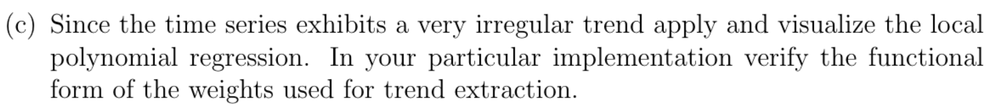

In [257]:
x = np.arange(len(df_crude_oil))
y = df_crude_oil["DCOILBRENTEU"].values
loess_est = loess_1d.loess_1d(x, y, degree=2, frac=0.2)
trend_loess = loess_est[1]
weights_loess = loess_est[2]

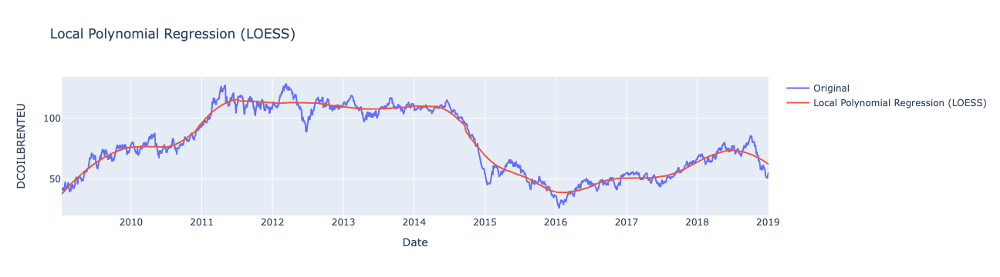

In [258]:
fig = go.Figure()

fig.add_trace(
    go.Scatter(
        x=df_crude_oil.index,
        y=df_crude_oil["DCOILBRENTEU"],
        mode="lines",
        name="Original",
    )
)

fig.add_trace(
    go.Scatter(
        x=df_crude_oil.index,
        y=trend_loess,
        mode="lines",
        name="Local Polynomial Regression (LOESS)",
    )
)

fig.update_layout(
    title="Local Polynomial Regression (LOESS)",
    xaxis_title="Date",
    yaxis_title="DCOILBRENTEU",
)

fig.show()

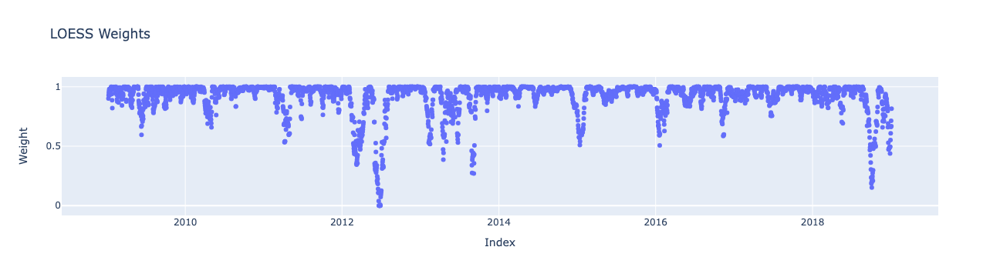

In [259]:
fig_weights = go.Figure()

fig_weights.add_trace(
    go.Scatter(x=df_crude_oil.index, y=weights_loess, mode="markers", name="Weights")
)

fig_weights.update_layout(
    title="LOESS Weights", xaxis_title="Index", yaxis_title="Weight"
)

fig_weights.show()

**Comments:**

We can see that configured LOESS showed a bit better trend comparing to the best CMA version. It have managed to capture trend without so big deviations because of spikes and without delays.

If we look at the weights values, we can see that weights are lower (even close to 0) on the spikes. This can be used to identify outliers and handle them appropriate. This is explained by the algorithms itself, it uses distance from point to neighboors to determine weight value, so further points have lower weights and if they fall under theshold they even can be 0.


### d)
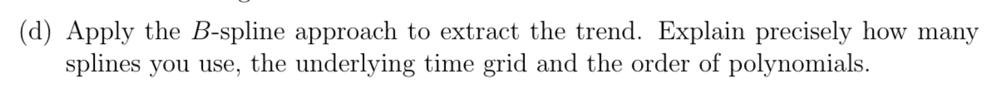

In [260]:
spline_order = 3  # 3-order polynomials
num_knots = 24  # number of split points

x = np.arange(len(df_crude_oil))
knots = np.linspace(0, len(x) - 1, num_knots)

spl = splrep(x, df_crude_oil["DCOILBRENTEU"], t=knots[1:-1], k=spline_order)
trend_bspline = BSpline(spl[0], spl[1], spl[2])(x)

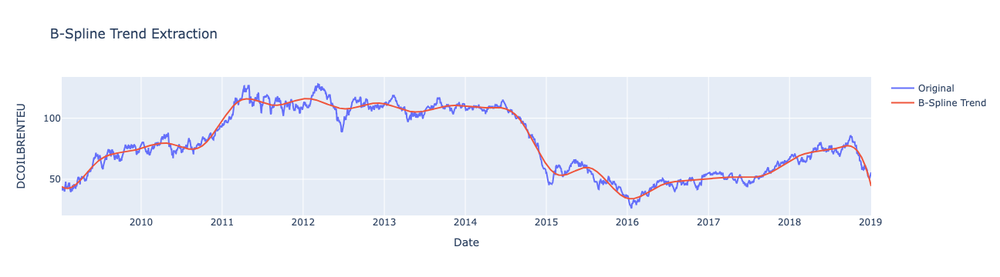

In [261]:
fig = go.Figure()

fig.add_trace(
    go.Scatter(
        x=df_crude_oil.index,
        y=df_crude_oil["DCOILBRENTEU"],
        mode="lines",
        name="Original",
    )
)

fig.add_trace(
    go.Scatter(
        x=df_crude_oil.index,
        y=trend_bspline,
        mode="lines",
        name="B-Spline Trend",
    )
)

fig.update_layout(
    title="B-Spline Trend Extraction", xaxis_title="Date", yaxis_title="DCOILBRENTEU"
)

fig.show()

**Comments:**

B-Spline have also managed to capture good trend, but according to the experiments, it highly depends on the selected parameters. Especially, number of knots (data intervals) and its positions.

The final version of this implementation has:

- 3-rd order polynomial splines
- equally spaced 24 knots (points in the data where the pieces of the spline meet)
- daily time grid

### e)
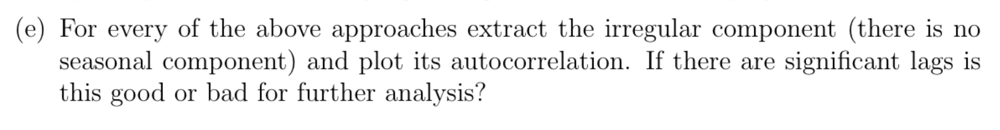

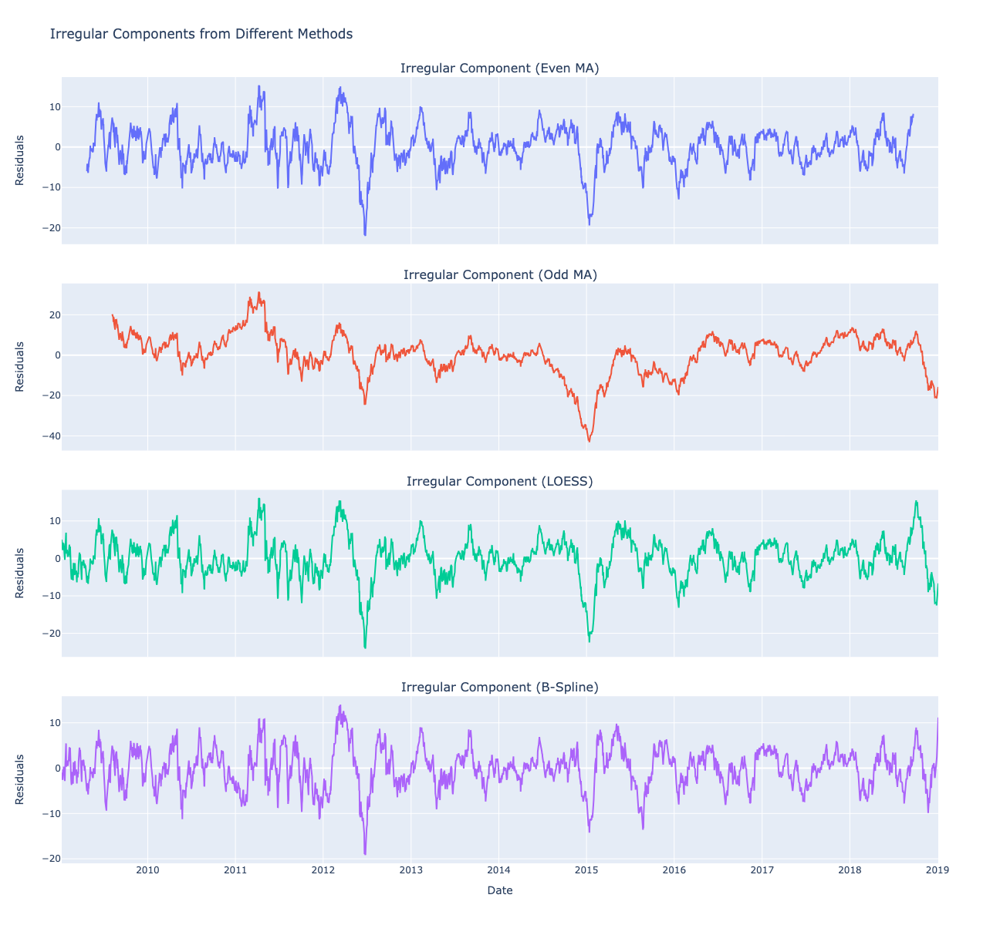

In [262]:
irregular_even = df_crude_oil["DCOILBRENTEU"] - even_ma_210
irregular_odd = df_crude_oil["DCOILBRENTEU"] - odd_ma_211
irregular_loess = df_crude_oil["DCOILBRENTEU"] - trend_loess
irregular_bspline = df_crude_oil["DCOILBRENTEU"] - trend_bspline

fig_irregular = make_subplots(
    rows=4,
    cols=1,
    shared_xaxes=True,
    vertical_spacing=0.05,
    subplot_titles=(
        "Irregular Component (Even MA)",
        "Irregular Component (Odd MA)",
        "Irregular Component (LOESS)",
        "Irregular Component (B-Spline)",
    ),
)

fig_irregular.add_trace(
    go.Scatter(
        x=df_crude_oil.index,
        y=irregular_even,
        mode="lines",
        name="Irregular Component (Even MA, 64 days)",
    ),
    row=1,
    col=1,
)

fig_irregular.add_trace(
    go.Scatter(
        x=df_crude_oil.index,
        y=irregular_odd,
        mode="lines",
        name="Irregular Component (Odd MA, 63 days)",
    ),
    row=2,
    col=1,
)

fig_irregular.add_trace(
    go.Scatter(
        x=df_crude_oil.index,
        y=irregular_loess,
        mode="lines",
        name="Irregular Component (LOESS)",
    ),
    row=3,
    col=1,
)

fig_irregular.add_trace(
    go.Scatter(
        x=df_crude_oil.index,
        y=irregular_bspline,
        mode="lines",
        name="Irregular Component (B-Spline)",
    ),
    row=4,
    col=1,
)

fig_irregular.update_layout(
    height=1200,
    width=800,
    title_text="Irregular Components from Different Methods",
    showlegend=False,
)
fig_irregular.update_yaxes(title_text="Residuals", row=1, col=1)
fig_irregular.update_yaxes(title_text="Residuals", row=2, col=1)
fig_irregular.update_yaxes(title_text="Residuals", row=3, col=1)
fig_irregular.update_yaxes(title_text="Residuals", row=4, col=1)
fig_irregular.update_xaxes(title_text="Date", row=4, col=1)

fig_irregular.show()

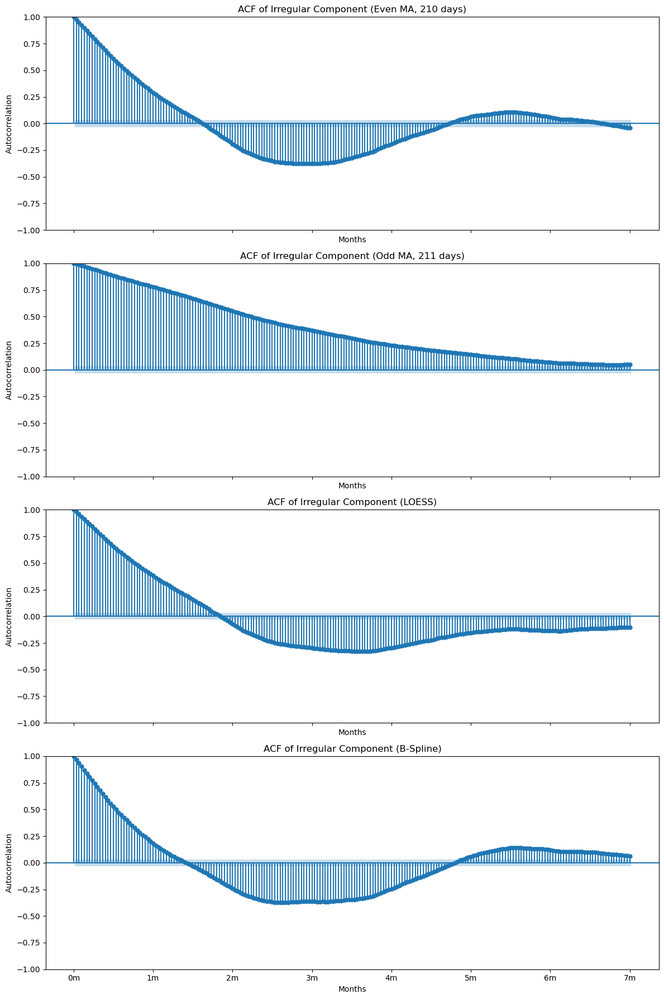

In [263]:
def add_acf_subplot(irregular_component, ax, title, lags_per_month=30):
    sm.graphics.tsa.plot_acf(
        irregular_component.dropna(), lags=210, ax=ax, bartlett_confint=False
    )
    ax.set_title(title)
    ax.set_xlabel("Months")
    ax.set_ylabel("Autocorrelation")

    months = np.arange(0, 210 + 1, lags_per_month)
    month_labels = [f"{i // lags_per_month}m" for i in months]
    ax.set_xticks(months)
    ax.set_xticklabels(month_labels)


fig, axs = plt.subplots(4, 1, figsize=(12, 18), sharex=True)

add_acf_subplot(irregular_odd, axs[1], "ACF of Irregular Component (Odd MA, 211 days)")
add_acf_subplot(
    irregular_even, axs[0], "ACF of Irregular Component (Even MA, 210 days)"
)
add_acf_subplot(irregular_loess, axs[2], "ACF of Irregular Component (LOESS)")
add_acf_subplot(irregular_bspline, axs[3], "ACF of Irregular Component (B-Spline)")

plt.tight_layout()
plt.show()

**Comments:**

All models have significant autocorrelation betweeen lags, which means that they have not fully captured all the patterns in the data. So, continuing analysing the seasonality or irregular components won't give any reliable results. 

## Task 2

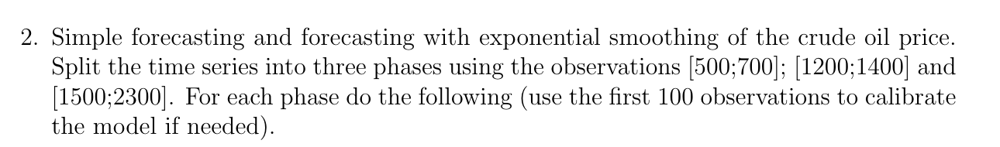

In [264]:
df_crude_oil_forecasting = pd.read_csv(
    "CrudeOil.csv", parse_dates=["DATE"], index_col="DATE"
)

df_crude_oil_forecasting_p1 = df_crude_oil_forecasting.iloc[500:700]
df_crude_oil_forecasting_p2 = df_crude_oil_forecasting.iloc[1200:1400]
df_crude_oil_forecasting_p3 = df_crude_oil_forecasting.iloc[1500:2300]

# make daily index
df_crude_oil_forecasting_p1 = df_crude_oil_forecasting_p1.asfreq("D").interpolate()
df_crude_oil_forecasting_p2 = df_crude_oil_forecasting_p2.asfreq("D").interpolate()
df_crude_oil_forecasting_p3 = df_crude_oil_forecasting_p3.asfreq("D").interpolate()

crude_oil_phases_train = [
    df_crude_oil_forecasting_p1[:100],
    df_crude_oil_forecasting_p2[:100],
    df_crude_oil_forecasting_p3[:100],
]
crude_oil_phases_test = [
    df_crude_oil_forecasting_p1[100:],
    df_crude_oil_forecasting_p2[100:],
    df_crude_oil_forecasting_p3[100:],
]

### a)
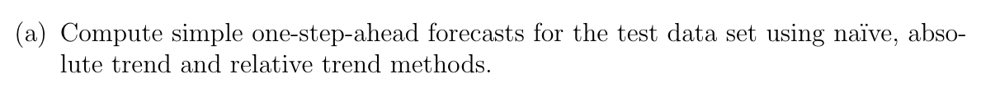

In [265]:
# naive, absolute, relative forecasts
def compute_forecasts(train, test):
    forecasts_naive = []
    forecasts_absolute = []
    forecasts_relative = []

    for i in range(len(test)):
        if i == 0:
            naive_forecast = train["DCOILBRENTEU"].iloc[-1]
        else:
            naive_forecast = test["DCOILBRENTEU"].iloc[i - 1]
        forecasts_naive.append(naive_forecast)

        if i == 0:
            absolute_forecast = train["DCOILBRENTEU"].iloc[-1] + (
                train["DCOILBRENTEU"].iloc[-1] - train["DCOILBRENTEU"].iloc[-2]
            )
        else:
            absolute_forecast = test["DCOILBRENTEU"].iloc[i - 1] + (
                test["DCOILBRENTEU"].iloc[i - 1] - test["DCOILBRENTEU"].iloc[i - 2]
            )
        forecasts_absolute.append(absolute_forecast)

        if i == 0:
            relative_forecast = train["DCOILBRENTEU"].iloc[-1] * (
                train["DCOILBRENTEU"].iloc[-1] / train["DCOILBRENTEU"].iloc[-2]
            )
        else:
            relative_forecast = test["DCOILBRENTEU"].iloc[i - 1] * (
                test["DCOILBRENTEU"].iloc[i - 1] / test["DCOILBRENTEU"].iloc[i - 2]
            )
        forecasts_relative.append(relative_forecast)

    return forecasts_naive, forecasts_absolute, forecasts_relative, test["DCOILBRENTEU"]


forecast_results = {}
for i, (train, test) in enumerate(zip(crude_oil_phases_train, crude_oil_phases_test)):
    phase_name = f"phase_{i+1}"
    forecast_results[phase_name] = compute_forecasts(train, test)

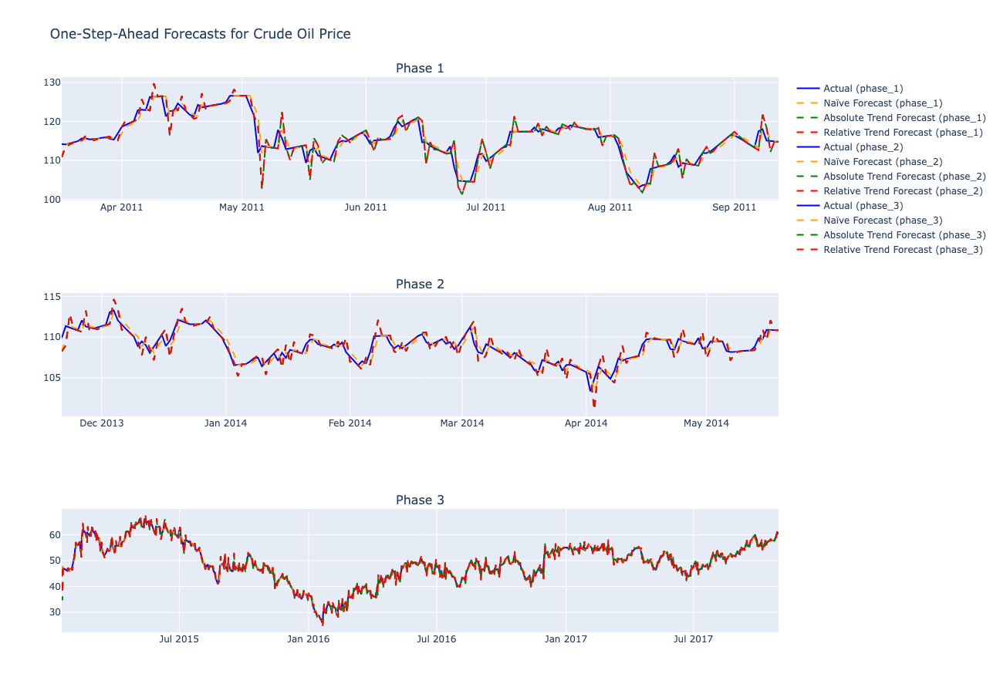

In [266]:
fig = make_subplots(
    rows=3, cols=1, shared_xaxes=False, subplot_titles=("Phase 1", "Phase 2", "Phase 3")
)

for i, (
    phase,
    (forecasts_naive, forecasts_absolute, forecasts_relative, actual),
) in enumerate(forecast_results.items()):
    row = i + 1

    fig.add_trace(
        go.Scatter(
            x=actual.index,
            y=actual,
            mode="lines",
            name=f"Actual ({phase})",
            line=dict(color="blue"),
        ),
        row=row,
        col=1,
    )
    fig.add_trace(
        go.Scatter(
            x=actual.index,
            y=forecasts_naive,
            mode="lines",
            name=f"Naïve Forecast ({phase})",
            line=dict(dash="dash", color="orange"),
        ),
        row=row,
        col=1,
    )
    fig.add_trace(
        go.Scatter(
            x=actual.index,
            y=forecasts_absolute,
            mode="lines",
            name=f"Absolute Trend Forecast ({phase})",
            line=dict(dash="dash", color="green"),
        ),
        row=row,
        col=1,
    )
    fig.add_trace(
        go.Scatter(
            x=actual.index,
            y=forecasts_relative,
            mode="lines",
            name=f"Relative Trend Forecast ({phase})",
            line=dict(dash="dash", color="red"),
        ),
        row=row,
        col=1,
    )

fig.update_layout(
    height=900,
    width=1200,
    title_text="One-Step-Ahead Forecasts for Crude Oil Price",
    showlegend=True,
)
fig.show()

### b)
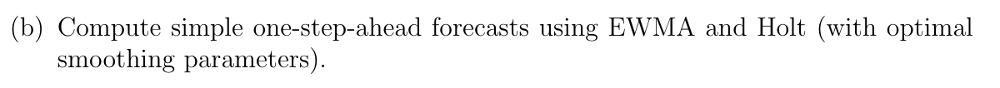

In [267]:
def ewma_forecasts(train, test):
    model = SimpleExpSmoothing(train)
    fit = model.fit(optimized=True)
    smoothing_level = round(fit.params["smoothing_level"], 3)

    one_step_forecasts = []
    history = train.tolist()
    for t in range(len(test)):
        yhat = fit.forecast(1)[0]
        one_step_forecasts.append(yhat)
        history.append(test.iloc[t])
        model = SimpleExpSmoothing(history)
        fit = model.fit(smoothing_level=smoothing_level, optimized=False)

    return one_step_forecasts, smoothing_level, test


def holt_forecasts(train, test):
    model = Holt(train)
    fit = model.fit(optimized=True)
    smoothing_level = round(fit.params["smoothing_level"], 3)
    smoothing_trend = round(fit.params["smoothing_trend"], 3)

    one_step_forecasts = []
    history = train.tolist()
    for t in range(len(test)):
        yhat = fit.forecast(1)[0]
        one_step_forecasts.append(yhat)
        history.append(test.iloc[t])
        model = Holt(history)
        fit = model.fit(
            smoothing_level=smoothing_level, smoothing_trend=smoothing_trend
        )

    return (
        one_step_forecasts,
        (smoothing_level, smoothing_trend),
        test,
    )


ewma_forecast_results = {}
holt_forecast_results = {}
for i, (train, test) in enumerate(zip(crude_oil_phases_train, crude_oil_phases_test)):
    phase_name = f"phase_{i+1}"
    ewma_forecast_results[phase_name] = ewma_forecasts(
        train["DCOILBRENTEU"], test["DCOILBRENTEU"]
    )
    holt_forecast_results[phase_name] = holt_forecasts(
        train["DCOILBRENTEU"], test["DCOILBRENTEU"]
    )

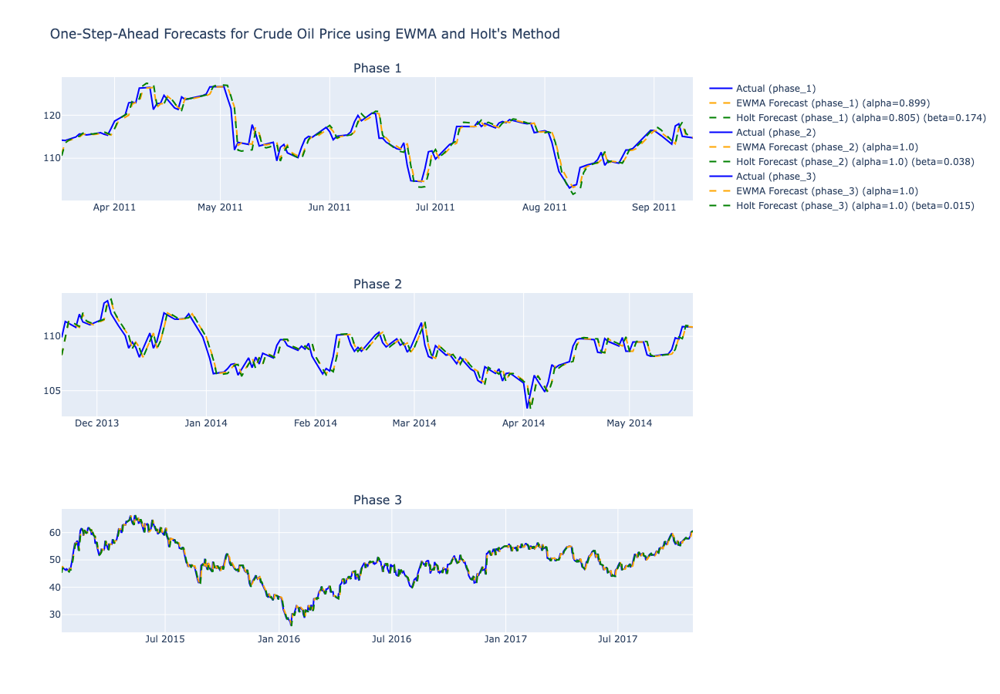

In [268]:
fig = make_subplots(
    rows=3, cols=1, shared_xaxes=False, subplot_titles=("Phase 1", "Phase 2", "Phase 3")
)

for i, phase in enumerate(["phase_1", "phase_2", "phase_3"]):
    row = i + 1

    actual = ewma_forecast_results[phase][2]
    forecasts_ewma = ewma_forecast_results[phase][0]
    ewma_alpha = ewma_forecast_results[phase][1]
    forecasts_holt = holt_forecast_results[phase][0]
    (holt_smoothing_level, holt_smoothing_trend) = holt_forecast_results[phase][1]

    fig.add_trace(
        go.Scatter(
            x=actual.index,
            y=actual,
            mode="lines",
            name=f"Actual ({phase})",
            line=dict(color="blue"),
        ),
        row=row,
        col=1,
    )
    fig.add_trace(
        go.Scatter(
            x=actual.index,
            y=forecasts_ewma,
            mode="lines",
            name=f"EWMA Forecast ({phase}) (alpha={ewma_alpha})",
            line=dict(dash="dash", color="orange"),
        ),
        row=row,
        col=1,
    )
    fig.add_trace(
        go.Scatter(
            x=actual.index,
            y=forecasts_holt,
            mode="lines",
            name=f"Holt Forecast ({phase}) (alpha={holt_smoothing_level}) (beta={holt_smoothing_trend})",
            line=dict(dash="dash", color="green"),
        ),
        row=row,
        col=1,
    )

fig.update_layout(
    height=900,
    width=1200,
    title_text="One-Step-Ahead Forecasts for Crude Oil Price using EWMA and Holt's Method",
    showlegend=True,
)
fig.show()

### c)
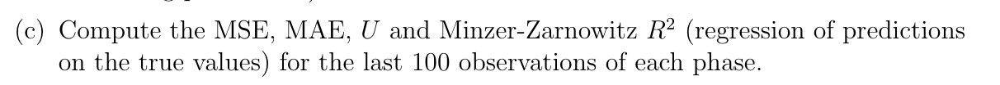

In [269]:
def compute_metrics(actual, forecast, naive):
    mse = mean_squared_error(actual, forecast)
    mae = mean_absolute_error(actual, forecast)
    u_statistic = np.sqrt(np.mean(np.square((forecast - actual) / actual))) / np.sqrt(
        np.mean(np.square((naive - actual) / actual))
    )
    slope, intercept, r_value, p_value, std_err = linregress(actual, forecast)
    minzer_zarnowitz_r2 = r_value**2

    metrics = {
        "MSE": mse,
        "MAE": mae,
        "U": u_statistic,
        "Minzer-Zarnowitz R2": minzer_zarnowitz_r2,
    }
    return metrics


metrics_table = []
for i, (train, test) in enumerate(zip(crude_oil_phases_train, crude_oil_phases_test)):
    phase_name = f"phase_{i+1}"
    (
        forecasts_naive,
        forecasts_absolute,
        forecasts_relative,
        actual,
    ) = forecast_results[phase_name]
    naive_metrics = compute_metrics(actual, forecasts_naive, forecasts_naive)
    absolute_metrics = compute_metrics(actual, forecasts_absolute, forecasts_naive)
    relative_metrics = compute_metrics(actual, forecasts_relative, forecasts_naive)
    ewma_metrics = compute_metrics(
        actual, ewma_forecast_results[phase_name][0], forecasts_naive
    )
    holt_metrics = compute_metrics(
        actual, holt_forecast_results[phase_name][0], forecasts_naive
    )

    metrics_table.append(
        [
            phase_name,
            "Naive",
            naive_metrics["MSE"],
            naive_metrics["MAE"],
            naive_metrics["U"],
            naive_metrics["Minzer-Zarnowitz R2"],
        ]
    )

    metrics_table.append(
        [
            phase_name,
            "Absolute",
            absolute_metrics["MSE"],
            absolute_metrics["MAE"],
            absolute_metrics["U"],
            absolute_metrics["Minzer-Zarnowitz R2"],
        ]
    )

    metrics_table.append(
        [
            phase_name,
            "Relative",
            relative_metrics["MSE"],
            relative_metrics["MAE"],
            relative_metrics["U"],
            relative_metrics["Minzer-Zarnowitz R2"],
        ]
    )

    metrics_table.append(
        [
            phase_name,
            "EWMA",
            ewma_metrics["MSE"],
            ewma_metrics["MAE"],
            ewma_metrics["U"],
            ewma_metrics["Minzer-Zarnowitz R2"],
        ]
    )

    metrics_table.append(
        [
            phase_name,
            "Holt",
            holt_metrics["MSE"],
            holt_metrics["MAE"],
            holt_metrics["U"],
            holt_metrics["Minzer-Zarnowitz R2"],
        ]
    )

metrics_df = pd.DataFrame(
    metrics_table, columns=["Phase", "Model", "MSE", "MAE", "U", "Minzer-Zarnowitz R2"]
)
metrics_df.set_index(["Phase", "Model"], inplace=True)

print(metrics_df)

                       MSE       MAE         U  Minzer-Zarnowitz R2
Phase   Model                                                      
phase_1 Naive     2.890081  1.023611  1.000000             0.899850
        Absolute  5.152601  1.328880  1.326202             0.847879
        Relative  5.052782  1.324317  1.312871             0.849965
        EWMA      2.977951  1.059260  1.016330             0.896376
        Holt      3.310874  1.135775  1.071168             0.895945
phase_2 Naive     0.500480  0.520722  1.000000             0.844712
        Absolute  0.947416  0.664806  1.377835             0.766874
        Relative  0.947035  0.664934  1.377398             0.766819
        EWMA      0.500480  0.520722  1.000000             0.844712
        Holt      0.515349  0.533991  1.014700             0.845636
phase_3 Naive     0.784155  0.600108  1.000000             0.986926
        Absolute  1.631011  0.787299  1.437364             0.973522
        Relative  1.583630  0.786287  1.417795  

### d)
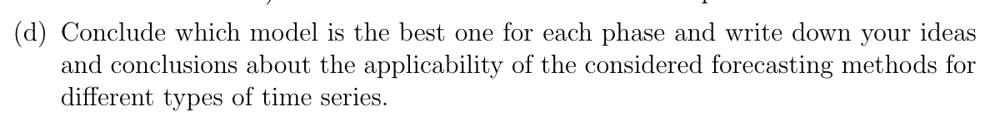

For all phases the naive model is the best one. This is because we have noisy time series with jumps. In such cases, naive implementation quickly adjusts to the changes comparing to the other models making it the best.

I also want to highlight the fact that for the 2nd and 3rd phases we have alpha parameter 1 for both EWMA and Holt, which simply makes them be very close to the naive (Holts) or equal (EWMA) to it.

Considering the applicability of the forecasting methods:
- if we have very noisy time series - "same change principle" models (absolute, relative, etc.) work bad because they follow spikes making them even bigger. For such cases, naive forecasting is preffered
- if we have no trend and no seasonality time series - use average forecasting or ECWA
- if we have no seasonality - Holts model can be used
- if we have both trend and seasonality - use case for the Holts-Winters model
- if we have jumps or trends - again naive forecast will be best, because it quickly adjust to the new level

So, for our case, the best option is naive, as it can follow the jumps and doesn't follow spikes more than it needed.

## Task 3

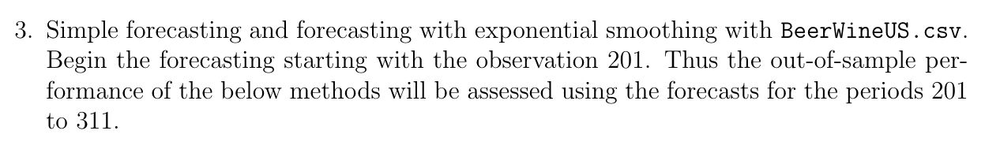

In [270]:
df_beer_wine_us = pd.read_csv("BeerWineUS.csv", parse_dates=["DATE"], index_col="DATE")
df_beer_wine_us

,MRTSSM4453USN
DATE,
1992-01-01,1509
1992-02-01,1541
1992-03-01,1597
1992-04-01,1675
1992-05-01,1822
...,...
2017-07-01,4726
2017-08-01,4577
2017-09-01,4470


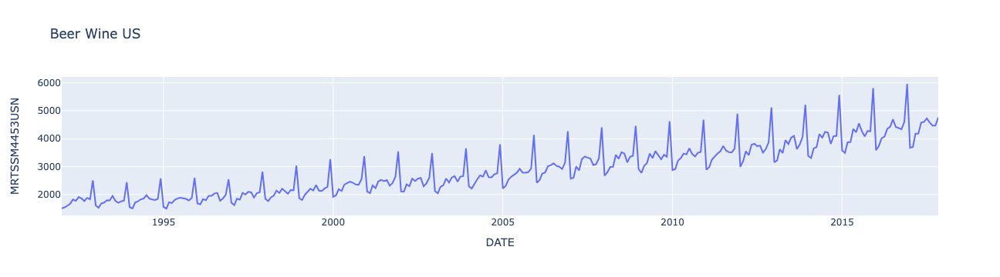

In [271]:
fig = go.Figure()
fig.update_layout(title="Beer Wine US", xaxis_title="DATE", yaxis_title="MRTSSM4453USN")
fig.add_trace(
    go.Scatter(
        x=df_beer_wine_us.index,
        y=df_beer_wine_us["MRTSSM4453USN"],
        mode="lines",
        name="Beer Wine US",
    )
)
fig.show()

### a)
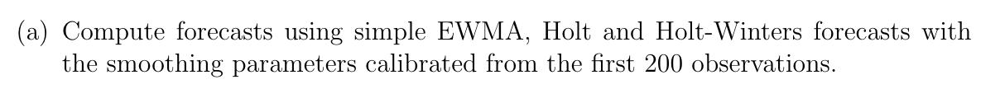

In [272]:
def holt_winters_forecasts(train, test, seasonal_periods, seasonal="add"):
    model = ExponentialSmoothing(
        train, trend="add", seasonal=seasonal, seasonal_periods=seasonal_periods
    )
    fit = model.fit(optimized=True)
    smoothing_level = round(fit.params["smoothing_level"], 3)
    smoothing_trend = round(fit.params["smoothing_trend"], 3)
    smoothing_seasonal = round(fit.params["smoothing_seasonal"], 3)

    one_step_forecasts = []
    history = train.tolist()
    for t in range(len(test)):
        yhat = fit.forecast(1)[0]
        one_step_forecasts.append(yhat)
        history.append(test.iloc[t])
        model = ExponentialSmoothing(
            history, trend="add", seasonal=seasonal, seasonal_periods=seasonal_periods
        )
        fit = model.fit(
            smoothing_level=smoothing_level,
            smoothing_trend=smoothing_trend,
            smoothing_seasonal=smoothing_seasonal,
        )

    return (
        one_step_forecasts,
        (smoothing_level, smoothing_trend, smoothing_seasonal),
        test,
    )


beer_wine_us_train = df_beer_wine_us.iloc[:200]
beer_wine_us_test = df_beer_wine_us.iloc[200:]

ewma_forecast_results = ewma_forecasts(
    beer_wine_us_train["MRTSSM4453USN"],
    beer_wine_us_test["MRTSSM4453USN"],
)
holt_forecast_results = holt_forecasts(
    beer_wine_us_train["MRTSSM4453USN"],
    beer_wine_us_test["MRTSSM4453USN"],
)
holt_winters_forecast_results = holt_winters_forecasts(
    beer_wine_us_train["MRTSSM4453USN"],
    beer_wine_us_test["MRTSSM4453USN"],
    seasonal_periods=12,
)

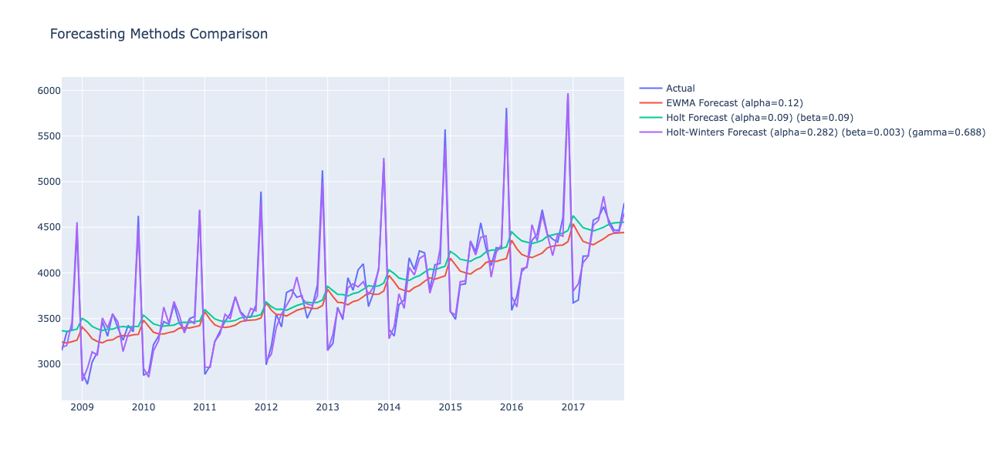

In [273]:
fig = go.Figure()
fig.add_trace(
    go.Scatter(
        x=beer_wine_us_test.index,
        y=beer_wine_us_test["MRTSSM4453USN"],
        mode="lines",
        name="Actual",
    )
)
fig.add_trace(
    go.Scatter(
        x=beer_wine_us_test.index,
        y=ewma_forecast_results[0],
        mode="lines",
        name=f"EWMA Forecast (alpha={ewma_forecast_results[1]})",
    )
)
fig.add_trace(
    go.Scatter(
        x=beer_wine_us_test.index,
        y=holt_forecast_results[0],
        mode="lines",
        name=f"Holt Forecast (alpha={holt_forecast_results[1][0]}) (beta={holt_forecast_results[1][1]})",
    )
)
fig.add_trace(
    go.Scatter(
        x=beer_wine_us_test.index,
        y=holt_winters_forecast_results[0],
        mode="lines",
        name=f"Holt-Winters Forecast (alpha={holt_winters_forecast_results[1][0]}) (beta={holt_winters_forecast_results[1][1]}) (gamma={holt_winters_forecast_results[1][2]})",
    )
)
fig.update_layout(height=600, width=1200, title_text="Forecasting Methods Comparison")
fig.show()

### b)
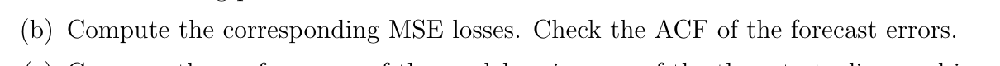

In [274]:
ewma_errors = beer_wine_us_test["MRTSSM4453USN"] - ewma_forecast_results[0]
holt_errors = beer_wine_us_test["MRTSSM4453USN"] - holt_forecast_results[0]
holt_winters_errors = (
    beer_wine_us_test["MRTSSM4453USN"] - holt_winters_forecast_results[0]
)

ewma_mse = mean_squared_error(
    beer_wine_us_test["MRTSSM4453USN"], ewma_forecast_results[0]
)
holt_mse = mean_squared_error(
    beer_wine_us_test["MRTSSM4453USN"], holt_forecast_results[0]
)
holt_winters_mse = mean_squared_error(
    beer_wine_us_test["MRTSSM4453USN"], holt_winters_forecast_results[0]
)

print("EWMA MSE:", ewma_mse)
print("Holt MSE:", holt_mse)
print("Holt-Winters MSE:", holt_winters_mse)

EWMA MSE: 259916.42397382742
Holt MSE: 248736.168020133
Holt-Winters MSE: 9270.77863552654


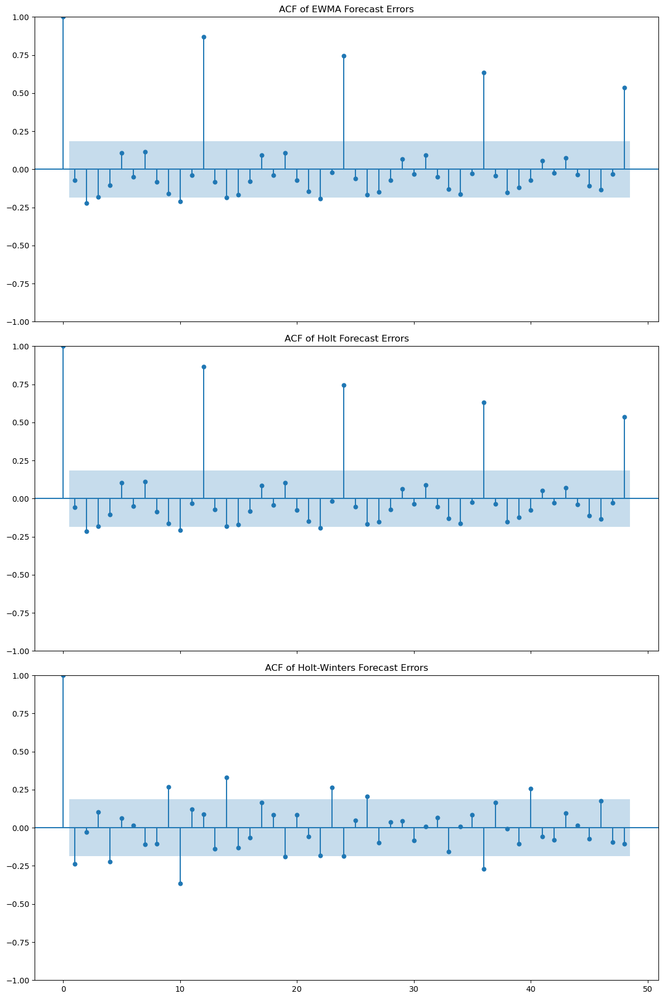

In [275]:
fig, axs = plt.subplots(3, 1, figsize=(12, 18), sharex=True)

# EWMA ACF
sm.graphics.tsa.plot_acf(ewma_errors, lags=48, ax=axs[0], bartlett_confint=False)
axs[0].set_title("ACF of EWMA Forecast Errors")

# Holt ACF
sm.graphics.tsa.plot_acf(holt_errors, lags=48, ax=axs[1], bartlett_confint=False)
axs[1].set_title("ACF of Holt Forecast Errors")

# Holt-Winters ACF
sm.graphics.tsa.plot_acf(
    holt_winters_errors, lags=48, ax=axs[2], bartlett_confint=False
)
axs[2].set_title("ACF of Holt-Winters Forecast Errors")

plt.tight_layout()
plt.show()

**Comments:**

We can see here that EWMA and Holt model have failed to capture seasonal spikes in the data. That is why the ACF have significant values once per year. But Holt-Winters model have managed to capture them and don't (almost) have significant correlation between forecast errors. The only significant ones are more looks like noise rather than seasonalities. 

### c)
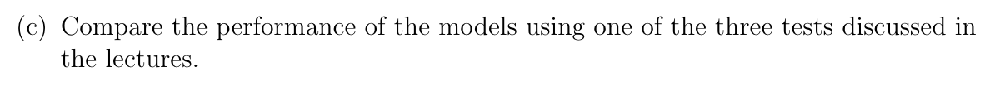

In [276]:
dm_ewma_holt = dm_test(
    beer_wine_us_test["MRTSSM4453USN"],
    ewma_forecast_results[0],
    holt_forecast_results[0],
)
dm_ewma_holt_winters = dm_test(
    beer_wine_us_test["MRTSSM4453USN"],
    ewma_forecast_results[0],
    holt_winters_forecast_results[0],
    one_sided=False,
)
dm_holt_holt_winters = dm_test(
    beer_wine_us_test["MRTSSM4453USN"],
    holt_forecast_results[0],
    holt_winters_forecast_results[0],
    one_sided=False,
)

print("EWMA vs Holt: p-value =", dm_ewma_holt[1])
print("EWMA vs Holt-Winters: p-value =", dm_ewma_holt_winters[1])
print("Holt vs Holt-Winters: p-value =", dm_holt_holt_winters[1])

EWMA vs Holt: p-value = 0.2191644914532389
EWMA vs Holt-Winters: p-value = 1.1722643781283546e-05
Holt vs Holt-Winters: p-value = 3.3984672552652027e-06


**Comments:**

According to our tests, EWMA and Holt have similar predictive accuracy. Holt-Winters has a significant improvement comparing with both models, using MSE as the loss function to rank them.

## Task 4
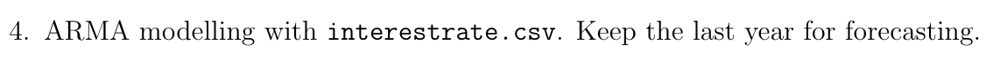

In [277]:
df_interest_rates_2_years = pd.read_csv(
    "interestrates2years.csv",
    parse_dates=["DATE"],
    index_col="DATE",
    delimiter=";",
    decimal=",",
)["value"].to_frame()
df_interest_rates_2_years

,value
DATE,
2003-01-01,2.40
2003-02-01,1.85
2003-03-01,1.87
2003-04-01,1.97
2003-05-01,2.31
...,...
2023-10-01,-0.78
2023-11-01,-0.02
2023-12-01,-0.51


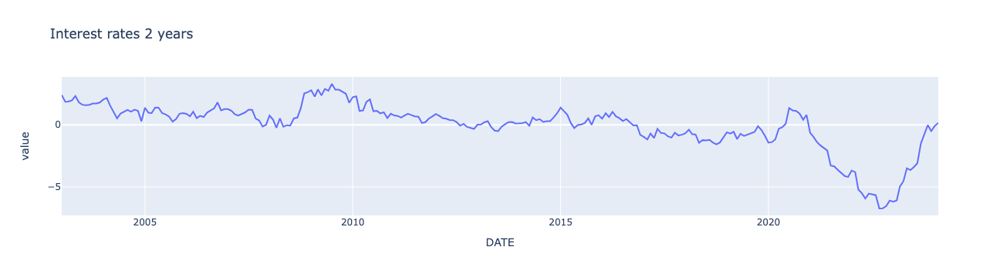

In [278]:
fig = go.Figure()
fig.update_layout(
    title="Interest rates 2 years", xaxis_title="DATE", yaxis_title="value"
)
fig.add_trace(
    go.Scatter(
        x=df_interest_rates_2_years.index,
        y=df_interest_rates_2_years["value"],
        mode="lines",
        name="Interest rates 2 years",
    )
)
fig.show()

### a)
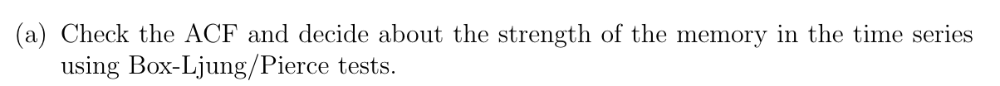

In [279]:
df_interest_rates_train = df_interest_rates_2_years[:-12]
df_interest_rates_test = df_interest_rates_2_years[-12:]

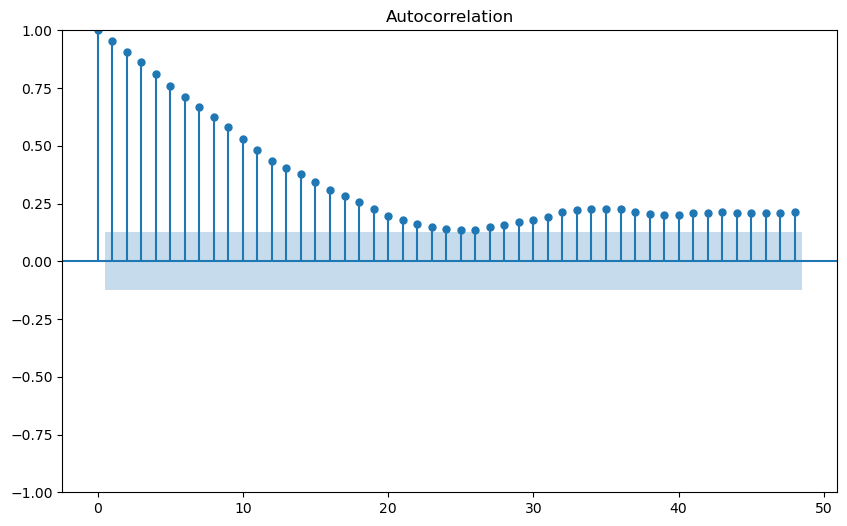

In [280]:
fig, ax = plt.subplots(figsize=(10, 6))
sm.graphics.tsa.plot_acf(
    df_interest_rates_train, lags=48, ax=ax, bartlett_confint=False
)
plt.show()

In [281]:
alljung_box_test = acorr_ljungbox(df_interest_rates_train, lags=[20], return_df=False)
box_pierce_test = acorr_ljungbox(
    df_interest_rates_train, lags=[20], return_df=False, boxpierce=True
)

print("Box-Ljung Test:")
print(alljung_box_test)

print("Box-Pierce Test:")
print(box_pierce_test)

Box-Ljung Test:
       lb_stat  lb_pvalue
20  1713.47302        0.0
Box-Pierce Test:
       lb_stat  lb_pvalue      bp_stat  bp_pvalue
20  1713.47302        0.0  1655.830053        0.0


**Comments:**

The ACF plot shows significant autocorrelation at the lag. This suggests that the time series has strong memory, meaning past values are correlated with future values over several time periods.

The p-values are extremely low (zero) in both tests. This indicates that the null hypothesis of no autocorrelation is rejected. 

So, we can conclude that there is a significant strengh of the memory in the time series data.

### b)
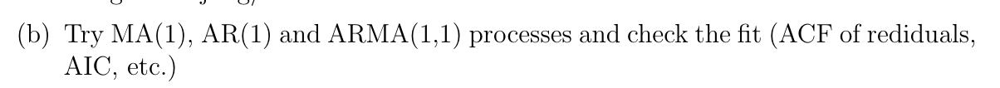

In [282]:
def plot_residuals_and_acf(residuals, model_name):
    fig, ax = plt.subplots(2, 1, figsize=(12, 8))

    ax[0].plot(residuals)
    ax[0].set_title(f"{model_name} Residuals")

    sm.graphics.tsa.plot_acf(residuals, lags=40, ax=ax[1], bartlett_confint=False)
    ax[1].set_title(f"{model_name} Residual ACF")

    plt.tight_layout()
    plt.show()

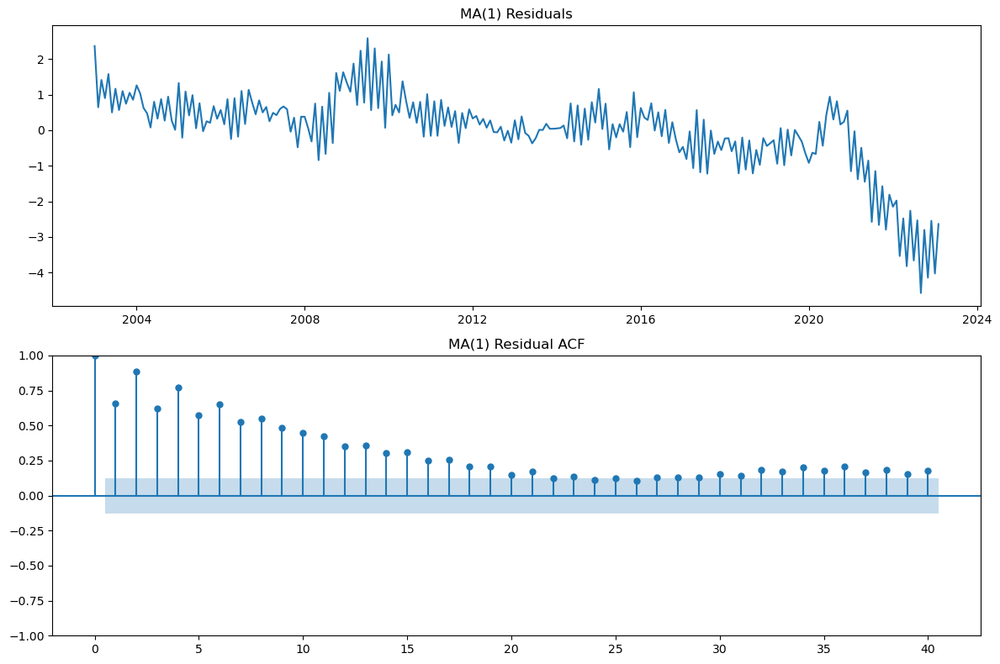

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                  value   No. Observations:                  242
Model:                 ARIMA(0, 0, 1)   Log Likelihood                -367.330
Date:                Wed, 19 Jun 2024   AIC                            740.661
Time:                        14:05:10   BIC                            751.128
Sample:                    01-01-2003   HQIC                           744.877
                         - 02-01-2023                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0334      0.169      0.198      0.843      -0.297       0.364
ma.L1          0.8636      0.024     36.558      0.000       0.817       0.910
sigma2         1.2120      0.088     13.702      0.000       1.039       1.385
===================================================================================
Ljung-Box (L1) (Q):                 107.46   Jarque-Bera (JB):               194.49
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               2.88   Skew:                            -1.42
Prob(H) (two-sided):                  0.00   Kurtosis:                         6.35
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [283]:
ma_model = ARIMA(df_interest_rates_train, order=(0, 0, 1))
ma_fitted = ma_model.fit()
plot_residuals_and_acf(ma_fitted.resid, "MA(1)")
ma_fitted.summary()

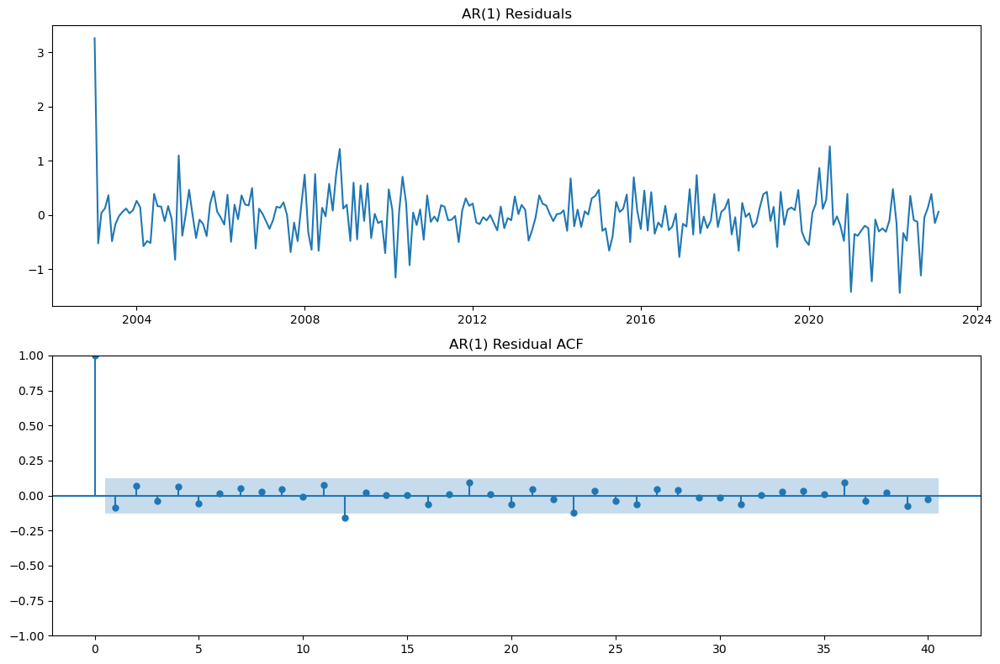

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                  value   No. Observations:                  242
Model:                 ARIMA(1, 0, 0)   Log Likelihood                -122.064
Date:                Wed, 19 Jun 2024   AIC                            250.128
Time:                        14:05:11   BIC                            260.595
Sample:                    01-01-2003   HQIC                           254.345
                         - 02-01-2023                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.8611      2.138     -0.403      0.687      -5.051       3.328
ar.L1          0.9911      0.013     78.269      0.000       0.966       1.016
sigma2         0.1579      0.011     14.536      0.000       0.137       0.179
===================================================================================
Ljung-Box (L1) (Q):                   1.37   Jarque-Bera (JB):                29.43
Prob(Q):                              0.24   Prob(JB):                         0.00
Heteroskedasticity (H):               1.21   Skew:                            -0.22
Prob(H) (two-sided):                  0.39   Kurtosis:                         4.65
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [284]:
ar_model = ARIMA(df_interest_rates_train, order=(1, 0, 0))
ar_fitted = ar_model.fit()
plot_residuals_and_acf(ar_fitted.resid, "AR(1)")
ar_fitted.summary()

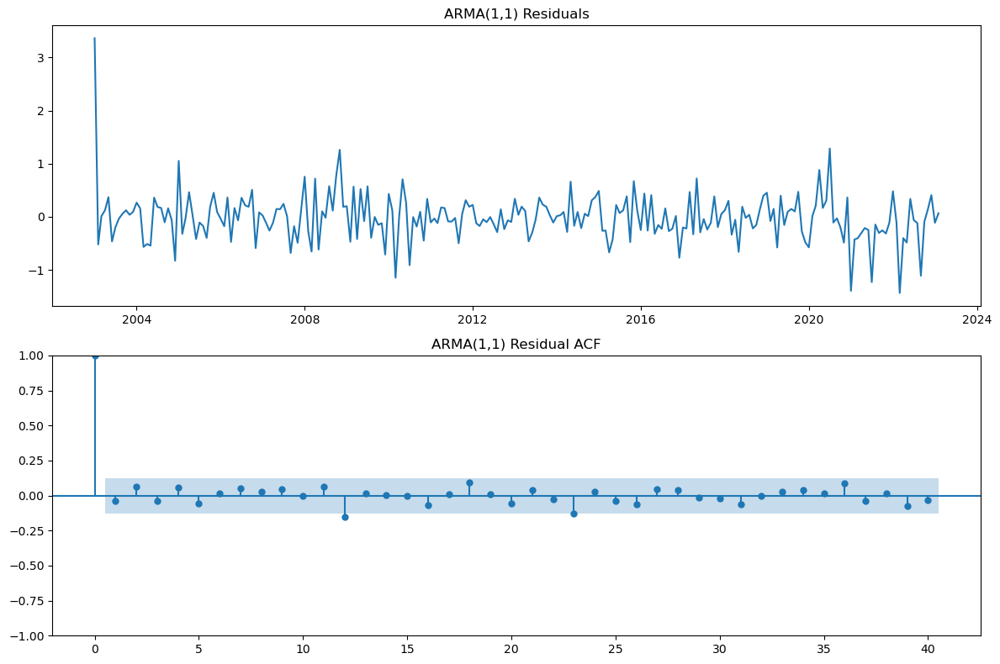

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                  value   No. Observations:                  242
Model:                 ARIMA(1, 0, 1)   Log Likelihood                -121.621
Date:                Wed, 19 Jun 2024   AIC                            251.241
Time:                        14:05:11   BIC                            265.197
Sample:                    01-01-2003   HQIC                           256.863
                         - 02-01-2023                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.9625      2.350     -0.410      0.682      -5.568       3.643
ar.L1          0.9927      0.012     81.239      0.000       0.969       1.017
ma.L1         -0.0572      0.068     -0.844      0.399      -0.190       0.076
sigma2         0.1573      0.011     14.603      0.000       0.136       0.178
===================================================================================
Ljung-Box (L1) (Q):                   0.06   Jarque-Bera (JB):                30.16
Prob(Q):                              0.81   Prob(JB):                         0.00
Heteroskedasticity (H):               1.25   Skew:                            -0.21
Prob(H) (two-sided):                  0.33   Kurtosis:                         4.68
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [285]:
arma_model = ARIMA(df_interest_rates_train, order=(1, 0, 1))
arma_fitted = arma_model.fit()
plot_residuals_and_acf(arma_fitted.resid, "ARMA(1,1)")
arma_fitted.summary()

**Comments:**

- MA(1): ACF shows significant autocorrelation in almost every lag. This means that the model hasn't managed to fit properly. As an additional proof, AIC/BIC metrics are the largest of the three models we tried. All parameters are significant, except for const param. It means that the mean of the series is not statistically different from zero. We can see that this parameter is not significant in all models as it should be.

- AR(1): ACF shows almost no significant autocorrelation, but we still can see that every year some small fraction of seasonality is not captured. As for metrics, we can see great improvement of AIC/BIC comparing to MA(1) process. All parameters are significant, except for const param (explained before).

- ARMA(1,1): ACF is the same as for AR(1) process meaning that the MA(1) doesn't give much improment to the model. We can additionally see it in the model summary, where ma.L1 parameter is not significant (along with the same const). It means that the ARMA(1,1) process almost fit to the AR(1) process for our data. There are small improvements of BIC/AIC, but they are tiny comparing to the AR(1).

### c) 
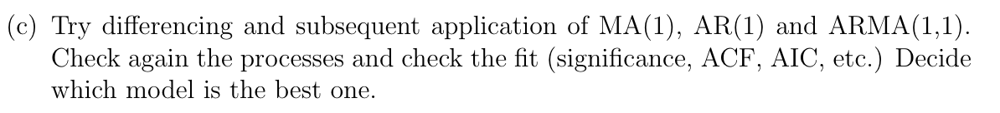

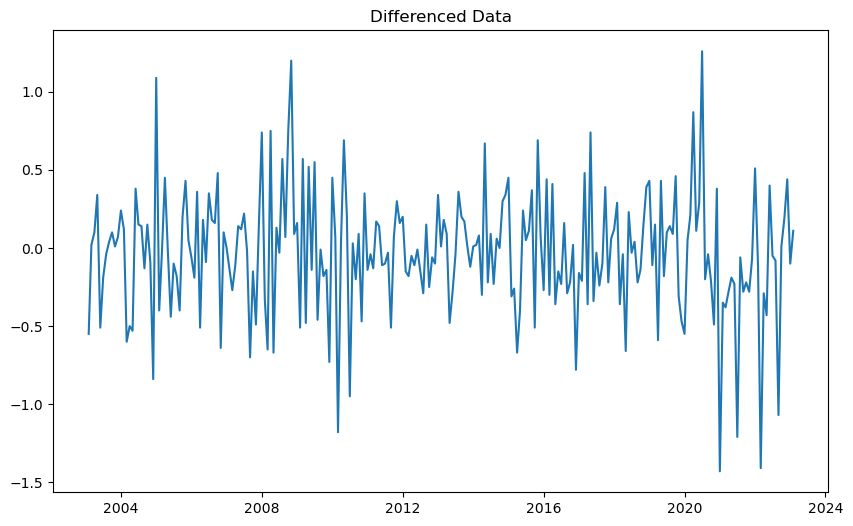

In [286]:
diff_df_interest_rates_train = df_interest_rates_train.diff().dropna()

plt.figure(figsize=(10, 6))
plt.plot(diff_df_interest_rates_train)
plt.title("Differenced Data")
plt.show()

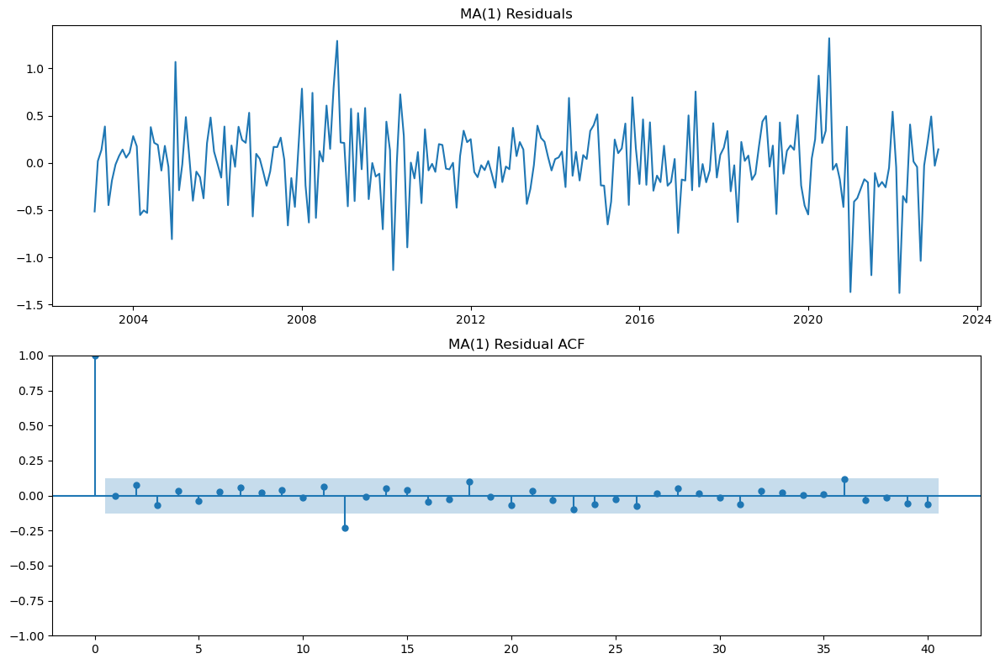

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                  value   No. Observations:                  241
Model:                 ARIMA(0, 0, 1)   Log Likelihood                -118.189
Date:                Wed, 19 Jun 2024   AIC                            242.379
Time:                        14:05:11   BIC                            252.833
Sample:                    02-01-2003   HQIC                           246.591
                         - 02-01-2023                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0351      0.024     -1.471      0.141      -0.082       0.012
ma.L1         -0.0703      0.065     -1.074      0.283      -0.198       0.058
sigma2         0.1561      0.011     14.727      0.000       0.135       0.177
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                28.55
Prob(Q):                              0.94   Prob(JB):                         0.00
Heteroskedasticity (H):               1.21   Skew:                            -0.19
Prob(H) (two-sided):                  0.40   Kurtosis:                         4.64
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [287]:
ma_model = ARIMA(diff_df_interest_rates_train, order=(0, 0, 1))
ma_fitted = ma_model.fit()
plot_residuals_and_acf(ma_fitted.resid, "MA(1)")
ma_fitted.summary()

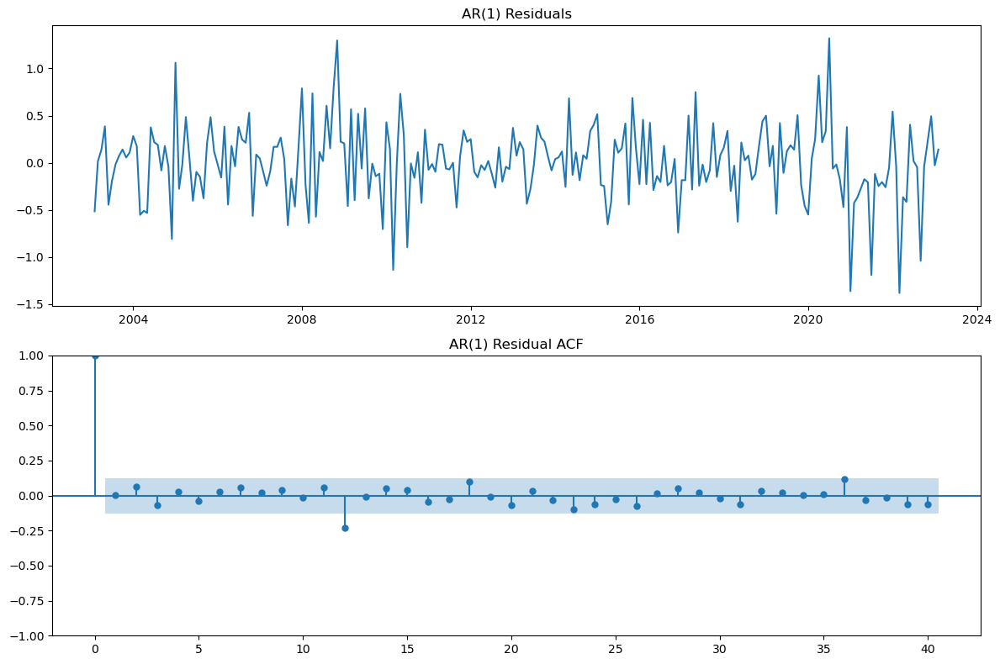

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                  value   No. Observations:                  241
Model:                 ARIMA(1, 0, 0)   Log Likelihood                -118.095
Date:                Wed, 19 Jun 2024   AIC                            242.190
Time:                        14:05:11   BIC                            252.644
Sample:                    02-01-2003   HQIC                           246.402
                         - 02-01-2023                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0351      0.024     -1.478      0.139      -0.082       0.011
ar.L1         -0.0797      0.066     -1.214      0.225      -0.208       0.049
sigma2         0.1560      0.011     14.740      0.000       0.135       0.177
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                28.88
Prob(Q):                              0.93   Prob(JB):                         0.00
Heteroskedasticity (H):               1.21   Skew:                            -0.19
Prob(H) (two-sided):                  0.39   Kurtosis:                         4.65
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [288]:
ar_model = ARIMA(diff_df_interest_rates_train, order=(1, 0, 0))
ar_fitted = ar_model.fit()
plot_residuals_and_acf(ar_fitted.resid, "AR(1)")
ar_fitted.summary()

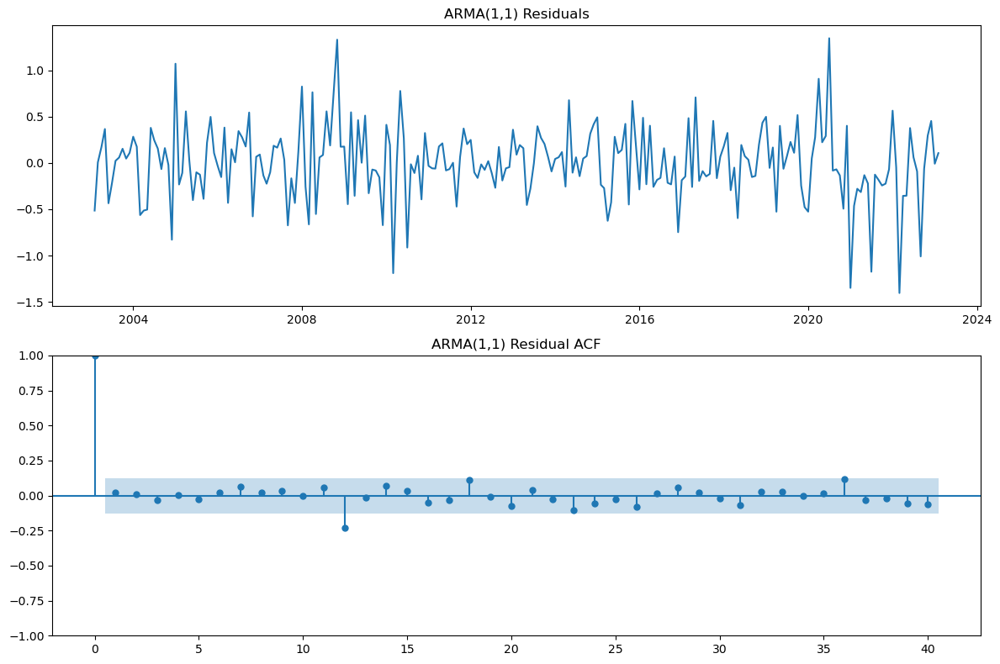

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                  value   No. Observations:                  241
Model:                 ARIMA(1, 0, 1)   Log Likelihood                -117.067
Date:                Wed, 19 Jun 2024   AIC                            242.133
Time:                        14:05:12   BIC                            256.072
Sample:                    02-01-2003   HQIC                           247.749
                         - 02-01-2023                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0351      0.024     -1.442      0.149      -0.083       0.013
ar.L1         -0.7056      0.294     -2.402      0.016      -1.281      -0.130
ma.L1          0.6185      0.322      1.921      0.055      -0.013       1.250
sigma2         0.1547      0.011     14.672      0.000       0.134       0.175
===================================================================================
Ljung-Box (L1) (Q):                   0.09   Jarque-Bera (JB):                35.54
Prob(Q):                              0.76   Prob(JB):                         0.00
Heteroskedasticity (H):               1.20   Skew:                            -0.19
Prob(H) (two-sided):                  0.41   Kurtosis:                         4.84
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [289]:
arma_model = ARIMA(diff_df_interest_rates_train, order=(1, 0, 1))
arma_fitted = arma_model.fit()
plot_residuals_and_acf(arma_fitted.resid, "ARMA(1,1)")
arma_fitted.summary()

**Comments:**

After differensing MA(1), AR(1), and ARMA(1,1) shows pretty close results. All three models provide similar fits to the data, with AIC, BIC, etc. metrics being quite close. There is no significant autocorrelation in the residuals for any model. Parameters of MA(1), AR(1) processes are not significant, however parameters of ARMA(1,1) shows significance (ar.L1), but without any improvement of the fit.

This means that after differencing, the time series behaves like white noise, which is indicated by the stable significance of the sigma2 parameter (the variance of the residuals). The significant sigma2 parameter in all models shows that the differenced series has constant variance, characteristic of white noise.

### d)
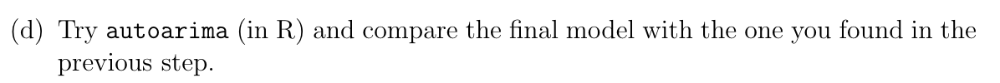

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=241.722, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=242.190, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=242.379, Time=0.02 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=241.615, Time=0.01 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=inf, Time=0.07 sec

Best model:  ARIMA(0,1,0)(0,0,0)[0]          
Total fit time: 0.132 seconds


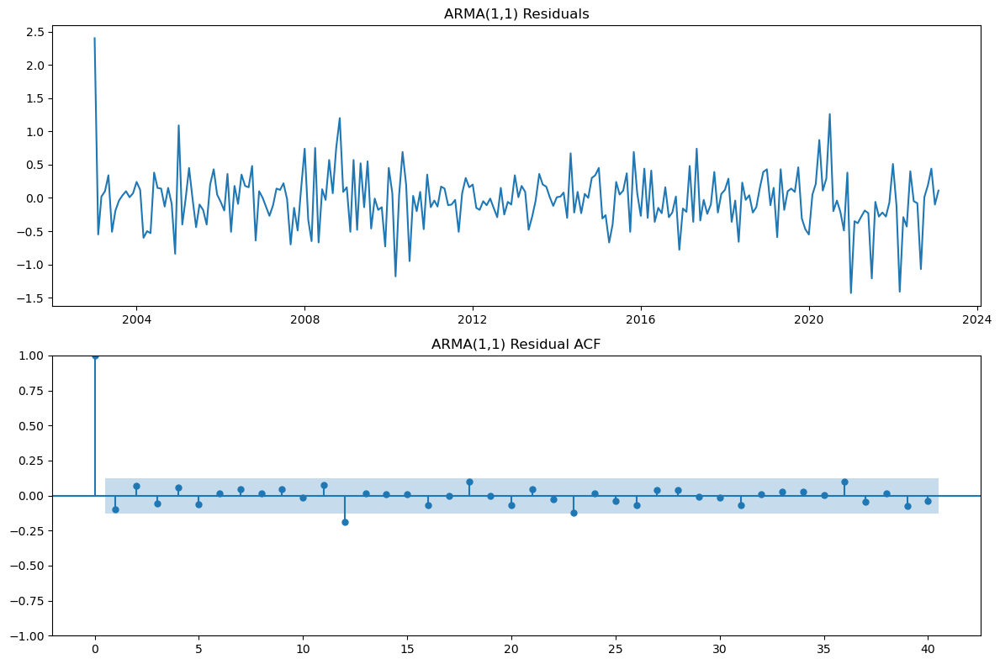

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  242
Model:               SARIMAX(0, 1, 0)   Log Likelihood                -119.808
Date:                Wed, 19 Jun 2024   AIC                            241.615
Time:                        14:05:12   BIC                            245.100
Sample:                    01-01-2003   HQIC                           243.019
                         - 02-01-2023                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2         0.1582      0.011     14.824      0.000       0.137       0.179
===================================================================================
Ljung-Box (L1) (Q):                   1.54   Jarque-Bera (JB):                27.41
Prob(Q):                              0.21   Prob(JB):                         0.00
Heteroskedasticity (H):               1.22   Skew:                            -0.20
Prob(H) (two-sided):                  0.38   Kurtosis:                         4.60
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [290]:
auto_model = auto_arima(
    df_interest_rates_train,
    seasonal=False,
    d=None,
    test="adf",
    start_p=0,
    start_q=0,
    max_p=12,
    max_q=12,
    D=None,
    trace=True,
    error_action="ignore",
    suppress_warnings=True,
    stepwise=True,
)
plot_residuals_and_acf(auto_model.resid(), "ARMA(1,1)")
auto_model.summary()

**Comments:**

Our auto ARIMA model converges to the ARIMA(0,1,0), meaning that the model only applies differencing to the original time series. After differencing, the resulting series does not show any significant autocorrelation patterns, indicating that it behaves like white noise. It can mean that the time series is modeled by a random walk, where future values are essentially unpredictable and based solely on the current value. This is normal behaviour for the rates.

Finally, we can select this model, just for simplicity (and also the lowest BIC/AIC of all models).

### e)
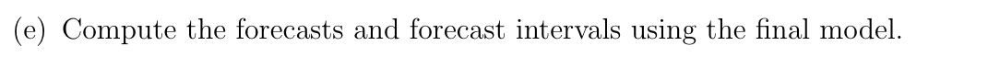

In [291]:
forecast, conf_int = auto_model.predict(
    n_periods=len(df_interest_rates_test), return_conf_int=True
)

forecast_series = pd.Series(
    forecast, index=df_interest_rates_test.index, name="forecast"
)
conf_int_df = pd.DataFrame(
    conf_int, index=df_interest_rates_test.index, columns=["lower", "upper"]
)

pd.concat([forecast_series, conf_int_df], axis=1)

,forecast,lower,upper
DATE,,,
2023-03-01,-6.08,-6.859669,-5.300331
2023-04-01,-6.08,-7.182619,-4.977381
2023-05-01,-6.08,-7.430427,-4.729573
2023-06-01,-6.08,-7.639338,-4.520662
2023-07-01,-6.08,-7.823393,-4.336607
2023-08-01,-6.08,-7.989792,-4.170208
2023-09-01,-6.08,-8.142811,-4.017189
2023-10-01,-6.08,-8.285237,-3.874763
2023-11-01,-6.08,-8.419007,-3.740993


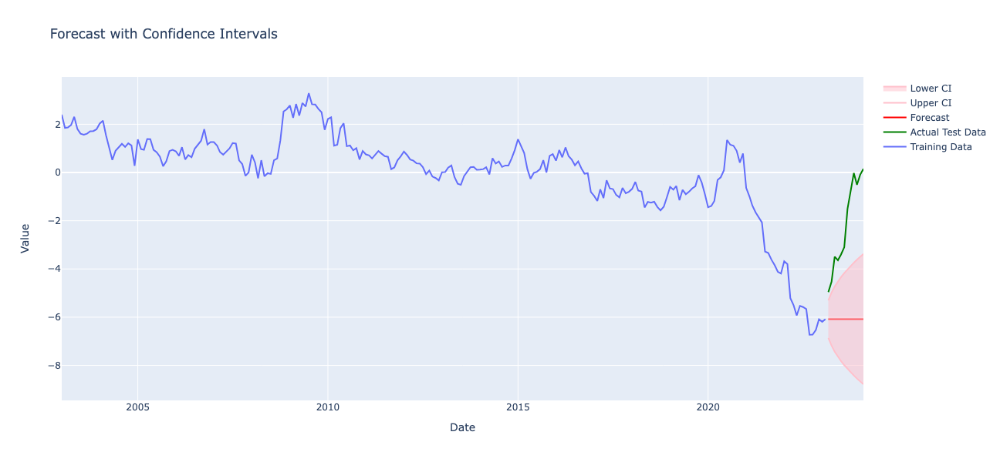

In [292]:
fig = make_subplots(rows=1, cols=1)
fig.add_trace(
    go.Scatter(
        x=df_interest_rates_train.index,
        y=df_interest_rates_train["value"],
        mode="lines",
        name="Training Data",
    )
)
fig.add_trace(
    go.Scatter(
        x=df_interest_rates_test.index,
        y=df_interest_rates_test["value"],
        mode="lines",
        name="Actual Test Data",
        line=dict(color="green"),
    )
)
fig.add_trace(
    go.Scatter(
        x=forecast_series.index,
        y=forecast_series,
        mode="lines",
        name="Forecast",
        line=dict(color="red"),
    )
)
fig.add_trace(
    go.Scatter(
        x=conf_int_df.index,
        y=conf_int_df["upper"],
        mode="lines",
        name="Upper CI",
        line=dict(color="pink"),
        fill=None,
    )
)
fig.add_trace(
    go.Scatter(
        x=conf_int_df.index,
        y=conf_int_df["lower"],
        mode="lines",
        name="Lower CI",
        line=dict(color="pink"),
        fill="tonexty",
    )
)
fig.update_layout(
    title="Forecast with Confidence Intervals",
    xaxis_title="Date",
    yaxis_title="Value",
    autosize=False,
    width=1200,
    height=600,
)
fig.show()

**Comments:**

We have the straight line because the final model ARIMA(0,1,0) applied differencing. Because of this we got naive constant forecast of the last value from our training set. So, as was stated in the lecture, the best forecast for rates is the naive one.

### f)
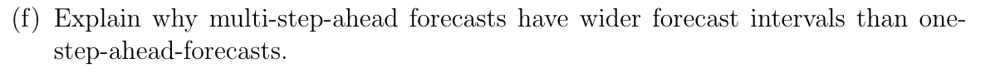

Multi-step-ahead forecasts typically have wider forecast intervals due to the increase of uncertainty over time. It is very locally, if we have some level of uncertainty in the first lag, it have to be vider for the following lags, because error is accumulated at every step.

### g)
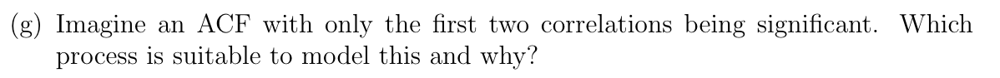

An Moving Average process of order 2 (MA(2)) is suitable for this case. This is explained by the definition, in MA(2) process the current value of the time series is a linear combination of the current and the last TWO white noise terms. This results in the property of the ACF that disappears for lags greater than the order of the process:
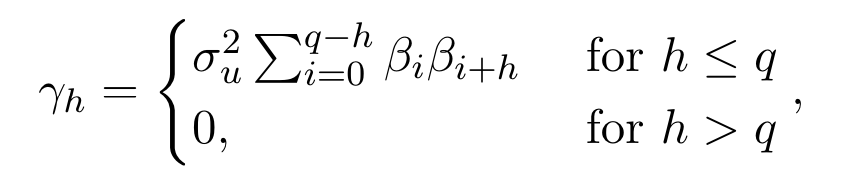

### h)
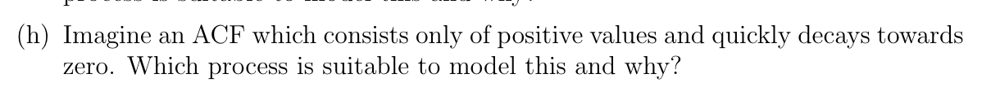

An Autoregressive (AR(1)) process with aplha equal to 0.1 (or some other small value) is suitable for this case. This is explained by the definition, in AR(1) process the current value of the time series is a linear combination of the previous term multiplied by aplha. So, if the alpha is equal to 0.1, we will get the current value ACF almost immediately decay expronentailly (alpha is multiplied by itselt at every lag) to zero. Because alpha is greater than zero, ACF will only consist of positive values.
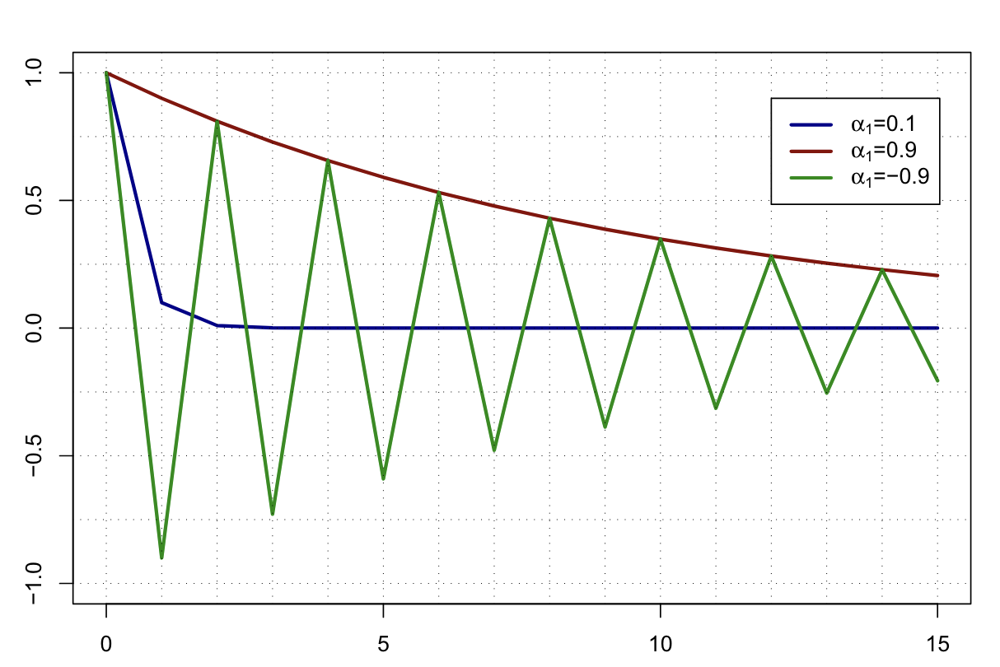

## Task 5
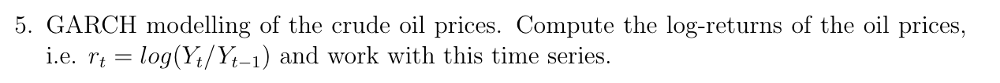

In [293]:
df_crude_oil_log = pd.read_csv("CrudeOil.csv", parse_dates=["DATE"], index_col="DATE")
df_crude_oil_log["DCOILBRENTEU"] = np.log(
    df_crude_oil_log["DCOILBRENTEU"] / df_crude_oil_log["DCOILBRENTEU"].shift(1)
)
df_crude_oil_log["DCOILBRENTEU"] = df_crude_oil_log["DCOILBRENTEU"].interpolate()
df_crude_oil_log = df_crude_oil_log.iloc[1:]

df_crude_oil_log

,DCOILBRENTEU
DATE,
2009-01-07,-0.055944
2009-01-08,-0.073825
2009-01-09,-0.014072
2009-01-12,-0.035581
2009-01-13,0.052211
...,...
2018-12-31,-0.017390
2019-01-01,-0.016751
2019-01-02,-0.016112


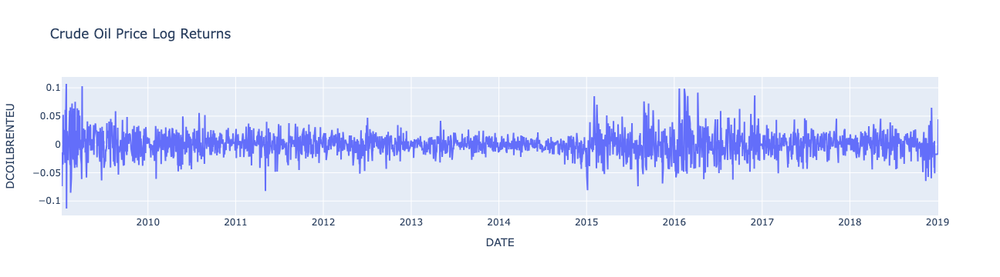

In [294]:
fig = go.Figure()
fig.update_layout(
    title="Crude Oil Price Log Returns", xaxis_title="DATE", yaxis_title="DCOILBRENTEU"
)
fig.add_trace(
    go.Scatter(
        x=df_crude_oil_log.index,
        y=df_crude_oil_log["DCOILBRENTEU"],
        mode="lines",
        name="Crude Oil Price Log Returns",
    )
)
fig.show()

### a)
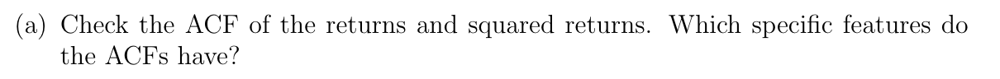

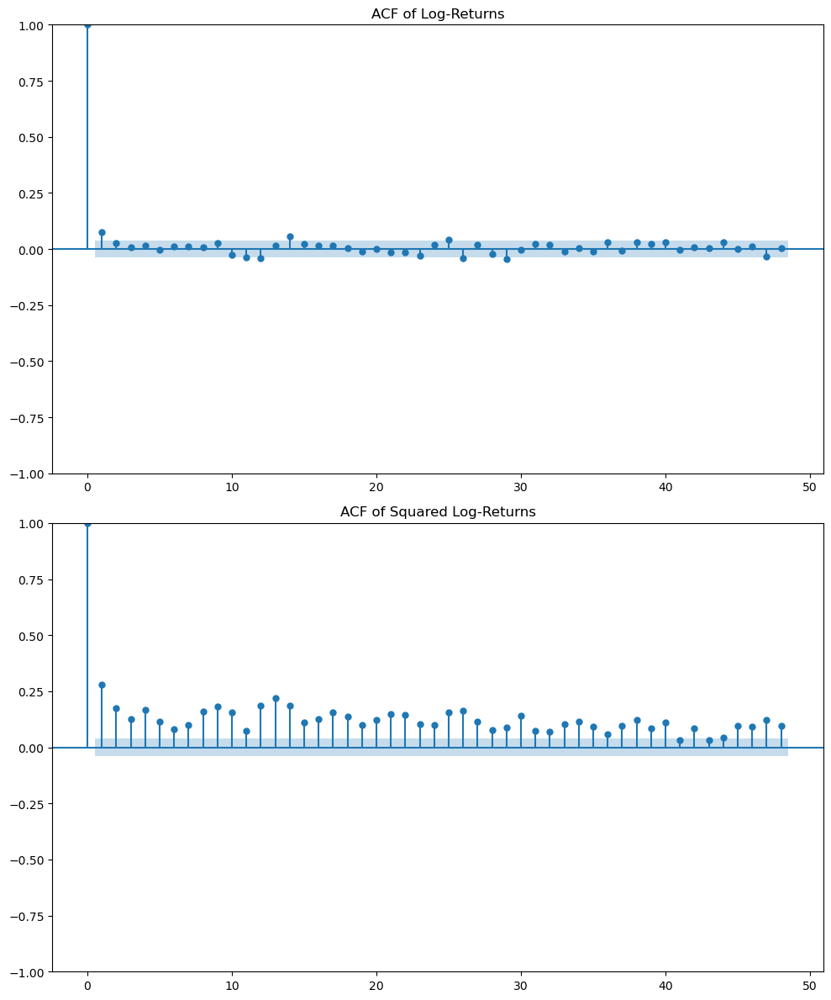

In [295]:
fig, ax = plt.subplots(2, 1, figsize=(10, 12))

sm.graphics.tsa.plot_acf(
    df_crude_oil_log["DCOILBRENTEU"], lags=48, ax=ax[0], bartlett_confint=False
)
ax[0].set_title("ACF of Log-Returns")

sm.graphics.tsa.plot_acf(
    df_crude_oil_log["DCOILBRENTEU"] ** 2, lags=48, ax=ax[1], bartlett_confint=False
)
ax[1].set_title("ACF of Squared Log-Returns")

plt.tight_layout()
plt.show()

**Comments:**

- Log-Returns: The ACF shows a significant spike at lag 1 with quick decay, showing a weak autocorrelation in the returns.
- Squared Log-Returns: The ACF shows significant autocorrelations at all plotted lags, indicating strong and persistent autocorrelation in the squared returns. It means having volatility clustering in the data, where periods of high volatility tend to be followed by high volatility and periods of low volatility tend to be followed by low volatility.


Strong autocorrelation in Squared Log-Returns indicates the use case for models that capture volatility dynamics. For example, (G)ARCH models.

### b)
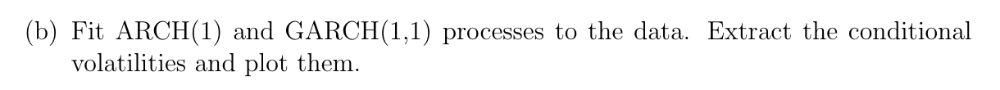

In [296]:
arch_m = arch_model(df_crude_oil_log["DCOILBRENTEU"], vol="ARCH", p=1)
arch_fit = arch_m.fit(disp="off")
arch_v = arch_fit.conditional_volatility
arch_m_resid = arch_fit.resid

garch_m = arch_model(
    df_crude_oil_log["DCOILBRENTEU"],
    vol="GARCH",
    p=1,
    q=1,
)
garch_fit = garch_m.fit(disp="off")
garch_v = garch_fit.conditional_volatility
garch_m_resid = garch_fit.resid

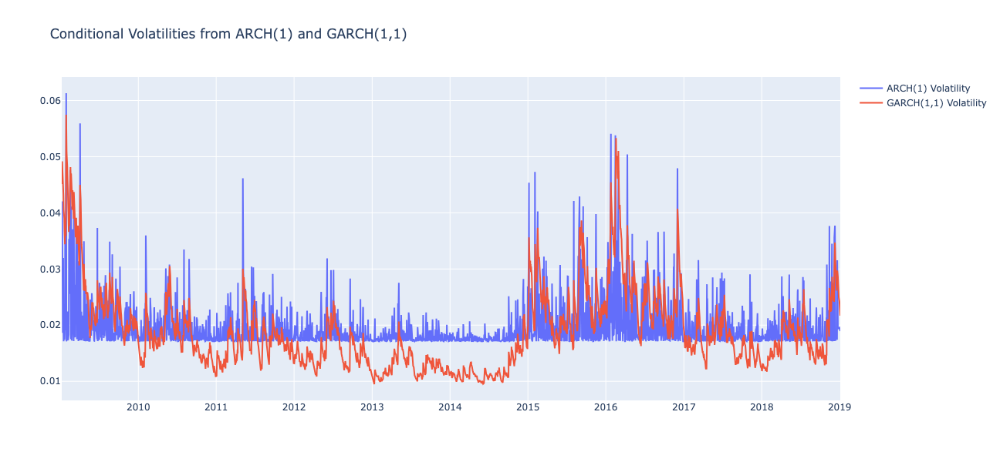

In [297]:
fig = make_subplots(
    rows=1,
    cols=1,
)
fig.add_trace(
    go.Scatter(x=arch_v.index, y=arch_v, mode="lines", name="ARCH(1) Volatility"),
    row=1,
    col=1,
)
fig.add_trace(
    go.Scatter(x=garch_v.index, y=garch_v, mode="lines", name="GARCH(1,1) Volatility"),
    row=1,
    col=1,
)
fig.update_layout(
    title_text="Conditional Volatilities from ARCH(1) and GARCH(1,1)", height=600
)
fig.show()

**Comments:**

The ARCH(1) model captures spikes in volatility effectively but does not preserve the persistence of volatility over longer periods. Hovewer, the GARCH(1,1) model shows a more stable and persistent volatility pattern, making it more suitable for series with long memory in volatility.

### c)
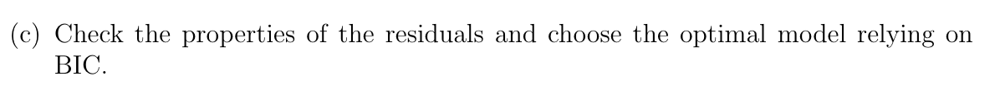

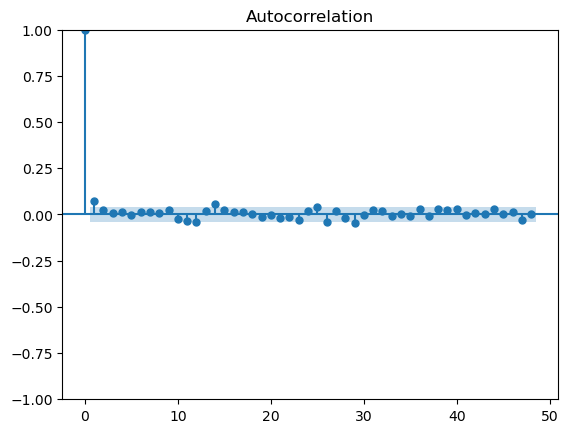

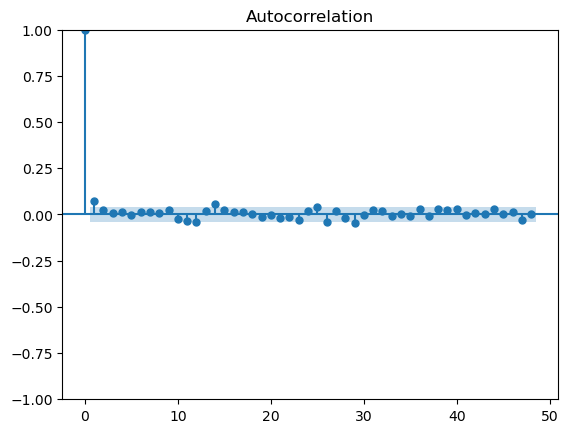

In [298]:
sm.graphics.tsa.plot_acf(arch_m_resid, lags=48, bartlett_confint=False)
sm.graphics.tsa.plot_acf(garch_m_resid, lags=48, bartlett_confint=False)
plt.show()

In [299]:
print(arch_fit)
print(garch_fit)

                      Constant Mean - ARCH Model Results                      
Dep. Variable:           DCOILBRENTEU   R-squared:                       0.000
Mean Model:             Constant Mean   Adj. R-squared:                  0.000
Vol Model:                       ARCH   Log-Likelihood:                6606.56
Distribution:                  Normal   AIC:                          -13207.1
Method:            Maximum Likelihood   BIC:                          -13189.5
                                        No. Observations:                 2608
Date:                Wed, Jun 19 2024   Df Residuals:                     2607
Time:                        14:05:12   Df Model:                            1
                                  Mean Model                                 
                 coef    std err          t      P>|t|       95.0% Conf. Int.
-----------------------------------------------------------------------------
mu         1.5811e-04  3.800e-04      0.416      0.677 

**Comments:**

The negative values for AIC and BIC occur due to the high log-likelihood values, indicating a good model fit. The GARCH(1,1) model is the better compared to the ARCH(1) model based on the comparison of AIC/BIC metrics. This is because GARCH(1,1) has an additional significant (by the way all parameters are significant for all models) parameters, which gives additional flexibility for the model.

Additionally, I performed many experiments and found out that the results (which model is better) highly depend on the sequence of the processing steps applied to the data. For example, here we applied linear interpolation for missing values but if we transform prices to daily index (as I did in the previous tasks) more missing values will arise (because ts is not consistent) and the resultive models will be totally different. Moveover, different interpolation methods also results in much different model result.

### d)
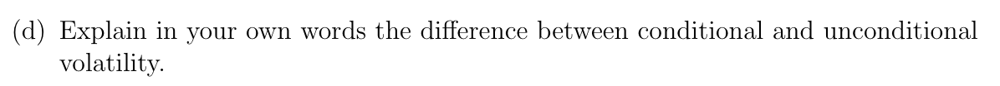

In our case, unconditional volatility is general volatility (variance) of the returns. It is constant value and shows how our values can vary in average by looking at the whole time series data. For example, if we calculate the variance of daily returns over the past year, this value is the unconditional volatility.

Meanwhile, conditional volatility is a volatility of returns based on some past information. It measures volatility that vary according to different conditionios like news, etc. Conditional volatility obviously vary from time-to-time. Here, we used GARCH model to estimate it. For example, oftern after investors report release, stock prices become more volatile because of it.

### e)
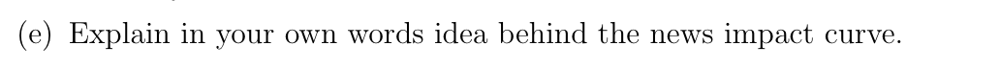

The idea behind is to measure the expected volatility (without any "news") against the real that have some. We just calculate the difference and define how new "news" affects the volatility of our time series in the future.

For example, the same company releases its investor report. The release of this report is likely to cause an immediate increase in volatility as investors react to the new information.

- Without News: The stock's expected volatility is 1.5% per day based on historical data.
- With News: After the investor report is released, the actual volatility jumped to 4%.

The news impact curve helps to capture this difference, showing that the new information (the investor report) increased the expected volatility by 2.5%.

## Task 6
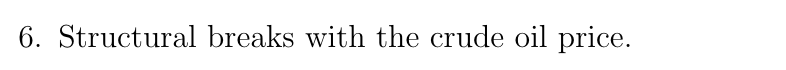

In [300]:
df_crude_oil_breaks = pd.read_csv(
    "CrudeOil.csv", parse_dates=["DATE"], index_col="DATE"
)
df_crude_oil_breaks = df_crude_oil_breaks.asfreq("D")
df_crude_oil_breaks["DCOILBRENTEU"] = df_crude_oil_breaks["DCOILBRENTEU"].interpolate()
df_crude_oil_breaks = df_crude_oil_breaks.iloc[2:]

df_crude_oil_breaks

,DCOILBRENTEU
DATE,
2009-01-08,42.940000
2009-01-09,42.340000
2009-01-10,41.846667
2009-01-11,41.353333
2009-01-12,40.860000
...,...
2018-12-31,52.664000
2019-01-01,53.362000
2019-01-02,54.060000


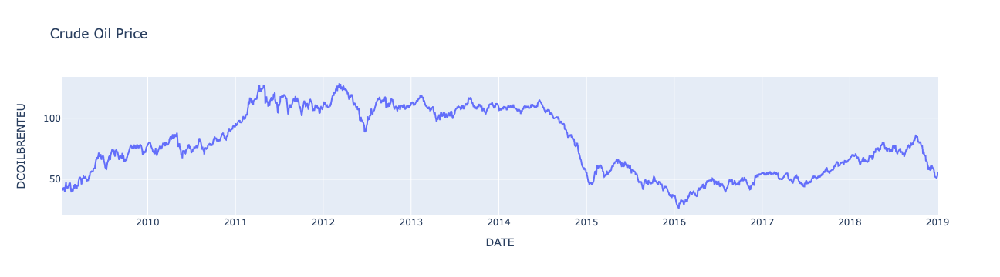

In [301]:
fig = go.Figure()
fig.update_layout(
    title="Crude Oil Price", xaxis_title="DATE", yaxis_title="DCOILBRENTEU"
)
fig.add_trace(
    go.Scatter(
        x=df_crude_oil_breaks.index,
        y=df_crude_oil_breaks["DCOILBRENTEU"],
        mode="lines",
        name="Crude Oil Price",
    )
)
fig.show()

### a)
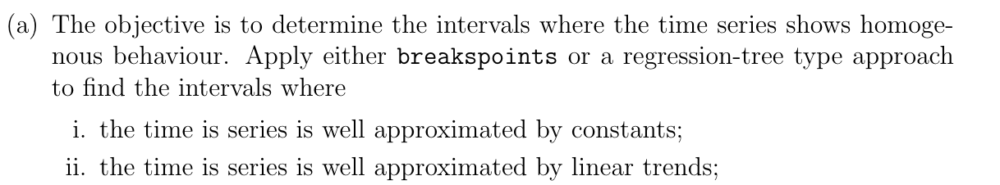

In [302]:
def compute_rss(signal, bkps):
    rss = 0
    for start, end in zip([0] + bkps[:-1], bkps):
        segment = signal[start:end]
        mean = segment.mean()
        rss += np.sum((segment - mean) ** 2)
    return rss


def compute_bic(signal, bkps):
    n = len(signal)
    k = len(bkps) - 1
    rss = compute_rss(signal, bkps)
    bic = n * np.log(rss / n) + k * np.log(n)
    return bic


signal = df_crude_oil_breaks["DCOILBRENTEU"].values
bic_values = []
rss_values = []
n_breakpoints = range(1, 20)

for n_bkps in n_breakpoints:
    algo = rpt.Binseg(model="l2").fit(signal)
    bkps = algo.predict(n_bkps=n_bkps)
    bic = compute_bic(signal, bkps)
    rss = compute_rss(signal, bkps)
    bic_values.append(bic)
    rss_values.append(rss)

algo = rpt.Binseg(model="l2").fit(signal)
breakpoints_const = algo.predict(n_bkps=4)  # based on the plot below

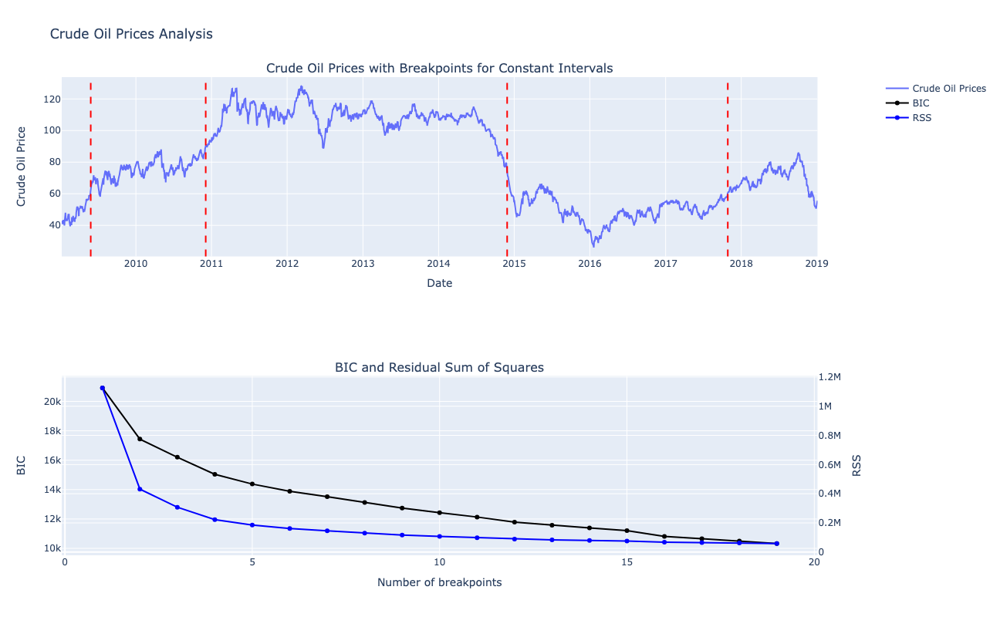

In [303]:
fig = make_subplots(
    rows=2,
    cols=1,
    subplot_titles=(
        "Crude Oil Prices with Breakpoints for Constant Intervals",
        "BIC and Residual Sum of Squares",
    ),
    specs=[[{"secondary_y": False}], [{"secondary_y": True}]],
)

fig.add_trace(
    go.Scatter(
        x=df_crude_oil_breaks.index,
        y=df_crude_oil_breaks["DCOILBRENTEU"],
        mode="lines",
        name="Crude Oil Prices",
    ),
    row=1,
    col=1,
)

for breakpoint in breakpoints_const[:-1]:
    fig.add_vline(
        x=df_crude_oil_breaks.index[breakpoint],
        line=dict(color="red", dash="dash"),
        row=1,
        col=1,
    )

fig.add_trace(
    go.Scatter(
        x=list(n_breakpoints),
        y=bic_values,
        mode="lines+markers",
        name="BIC",
        line=dict(color="black"),
    ),
    row=2,
    col=1,
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(
        x=list(n_breakpoints),
        y=rss_values,
        mode="lines+markers",
        name="RSS",
        line=dict(color="blue"),
    ),
    row=2,
    col=1,
    secondary_y=True,
)

fig.update_layout(
    title_text="Crude Oil Prices Analysis",
    xaxis=dict(title="Date"),
    xaxis2=dict(title="Number of breakpoints"),
    yaxis=dict(title="Crude Oil Price"),
    yaxis2=dict(title="BIC"),
    yaxis3=dict(title="RSS", overlaying="y2", side="right"),
    height=800,
)

fig.show()

In [304]:
def compute_rss_linear(signal, bkps, time_variable):
    rss = 0
    for start, end in zip([0] + bkps[:-1], bkps):
        segment = signal[start:end]
        time_segment = time_variable[start:end]
        coef = np.polyfit(time_segment, segment, 1)
        fit = np.polyval(coef, time_segment)
        rss += np.sum((segment - fit) ** 2)
    return rss


def compute_bic_linear(signal, bkps, time_variable):
    n = len(signal)
    k = len(bkps) - 1
    rss = compute_rss_linear(signal, bkps, time_variable)
    bic = n * np.log(rss / n) + k * np.log(n)
    return bic


time_variable = np.arange(len(df_crude_oil_breaks))
signal_with_time = np.column_stack(
    (time_variable, df_crude_oil_breaks["DCOILBRENTEU"].values)
)

bic_values = []
rss_values = []
n_brk = []
penalties = [
    1000000,
    3000000,
    5000000,
    7000000,
    10000000,
    30000000,
    50000000,
    70000000,
    100000000,
    200000000,
    300000000,
    400000000,
]

for pen in penalties:
    algo = rpt.Pelt(model="linear").fit(signal_with_time)
    bkps = algo.predict(pen=pen)
    bic = compute_bic_linear(signal_with_time[:, 1], bkps, signal_with_time[:, 0])
    rss = compute_rss_linear(signal_with_time[:, 1], bkps, signal_with_time[:, 0])
    n_brk.append(len(bkps))
    bic_values.append(bic)
    rss_values.append(rss)

algo = rpt.Pelt(model="linear").fit(signal_with_time)
breakpoints_linear = algo.predict(pen=30000000)  # based on the plot below

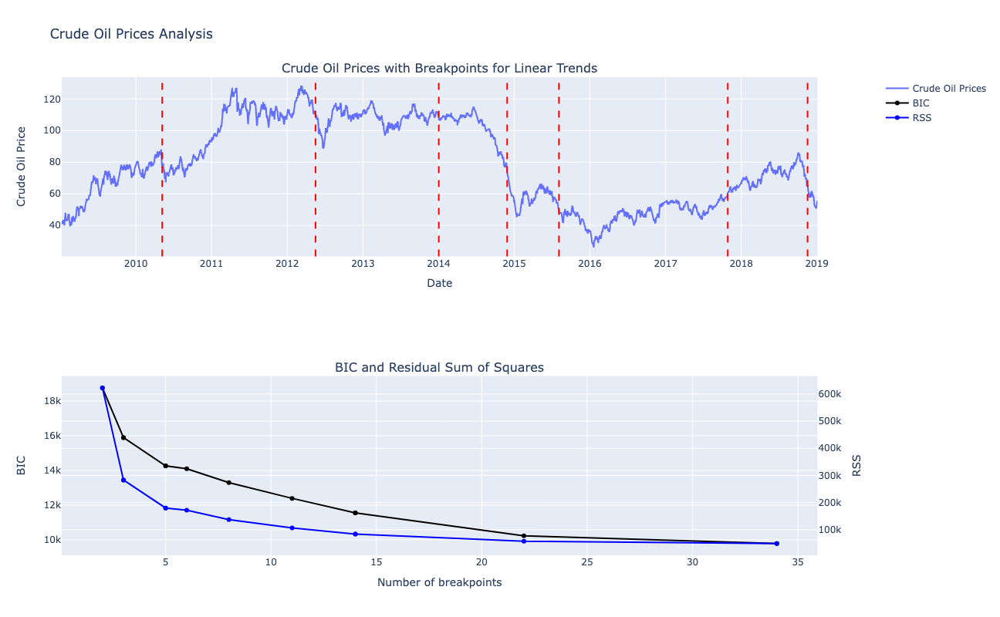

In [305]:
fig = make_subplots(
    rows=2,
    cols=1,
    subplot_titles=(
        "Crude Oil Prices with Breakpoints for Linear Trends",
        "BIC and Residual Sum of Squares",
    ),
    specs=[[{"secondary_y": False}], [{"secondary_y": True}]],
)

fig.add_trace(
    go.Scatter(
        x=df_crude_oil_breaks.index,
        y=df_crude_oil_breaks["DCOILBRENTEU"],
        mode="lines",
        name="Crude Oil Prices",
    ),
    row=1,
    col=1,
)

for breakpoint in breakpoints_linear[:-1]:
    fig.add_vline(
        x=df_crude_oil_breaks.index[breakpoint],
        line=dict(color="red", dash="dash"),
        row=1,
        col=1,
    )

fig.add_trace(
    go.Scatter(
        x=list(n_brk),
        y=bic_values,
        mode="lines+markers",
        name="BIC",
        line=dict(color="black"),
    ),
    row=2,
    col=1,
    secondary_y=False,
)

fig.add_trace(
    go.Scatter(
        x=list(n_brk),
        y=rss_values,
        mode="lines+markers",
        name="RSS",
        line=dict(color="blue"),
    ),
    row=2,
    col=1,
    secondary_y=True,
)

fig.update_layout(
    title_text="Crude Oil Prices Analysis",
    xaxis=dict(title="Date"),
    xaxis2=dict(title="Number of breakpoints"),
    yaxis=dict(title="Crude Oil Price"),
    yaxis2=dict(title="BIC"),
    yaxis3=dict(title="RSS", overlaying="y2", side="right"),
    height=800,
)

fig.show()

### b)
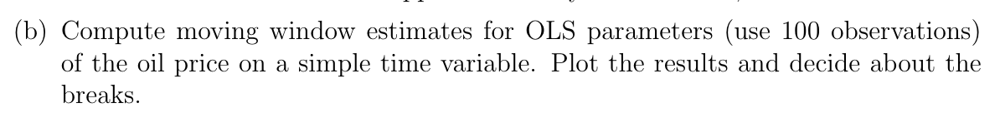

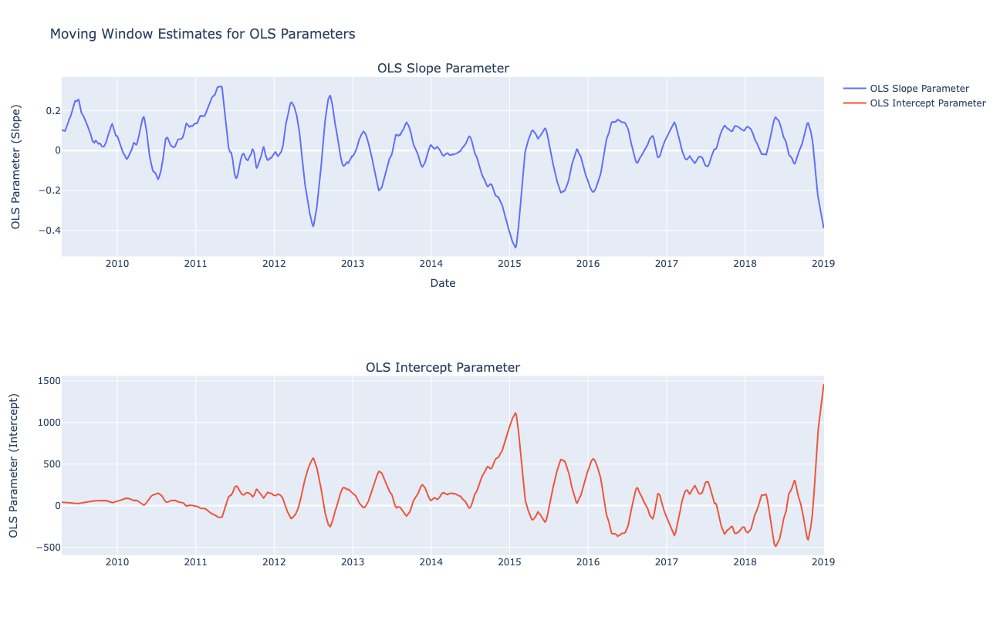

In [306]:
time_variable = np.arange(len(df_crude_oil_breaks)).reshape(-1, 1)

rolling_window = 100

slope_params = []
int_params = []
for i in range(len(df_crude_oil_breaks) - rolling_window + 1):
    window_time = time_variable[i : i + rolling_window]
    window_prices = df_crude_oil_breaks["DCOILBRENTEU"].values[i : i + rolling_window]
    model = LinearRegression().fit(window_time, window_prices)
    slope_params.append(model.coef_[0])
    int_params.append(model.intercept_)


df_slope_params = pd.DataFrame(
    {
        "Date": df_crude_oil_breaks.index[rolling_window - 1 :],
        "Slope": slope_params,
        "Intercept": int_params,
    }
)

fig = make_subplots(
    rows=2, cols=1, subplot_titles=("OLS Slope Parameter", "OLS Intercept Parameter")
)

fig.add_trace(
    go.Scatter(
        x=df_slope_params["Date"],
        y=df_slope_params["Slope"],
        mode="lines",
        name="OLS Slope Parameter",
    ),
    row=1,
    col=1,
)

fig.add_trace(
    go.Scatter(
        x=df_slope_params["Date"],
        y=df_slope_params["Intercept"],
        mode="lines",
        name="OLS Intercept Parameter",
    ),
    row=2,
    col=1,
)

fig.update_layout(
    title="Moving Window Estimates for OLS Parameters",
    xaxis_title="Date",
    height=800,
)

fig.update_yaxes(title_text="OLS Parameter (Slope)", row=1, col=1)
fig.update_yaxes(title_text="OLS Parameter (Intercept)", row=2, col=1)

fig.show()

**Comments:**

There is observable volatility in the time series data for both the slope and intercept parameters. The changes indicates where the underlying behavior of the oil prices has changed, confirming the presence of structural breaks in the time series.

For example, we can clearly see something happened in 2015 and if we look at the original data we will see rapid decrease - structural break. Another example is the middle of 2012, the same situation, we can see rapid decrease in the previously growing time series.

### c)
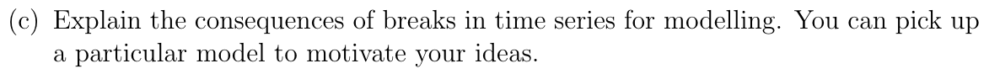

Structural breaks can create instability in the parameters of a model, leading to low validity and reliability. For instance, ARIMA models assume that the series becomes stationary after differencing, meaning the statistical properties of the time series do not change over time. When a structural break occurs, it introduces changes in the process, potentially affecting the mean, variance, or autocorrelation. This disrupts the assumption of stationarity and leads to unreliable parameter estimates and model forecasts.

Finally, in modelling we try to estimate the parameters of the time series for different models. Structural breaks may change these parameters making modelling not be able to find the actual ones.

### d)
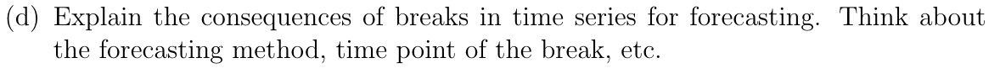

Structural breaks not only disrupt the modeling process but also impact forecasting accuracy. Let's consider the ARIMA models again. Suppose we have a stationary time series during the training stage but encounter structural breaks in the test period. Our ARIMA model relies on the historical mean and autocorrelation structure to make forecasts. When a break occurs, the relationship changes, leading to potentially inaccurate forecasts. 

As an example, an ARIMA(1,1,1) model forecasting NVIDIA growth, a sudden technological breakthrough (chatGPT) can change the growth pattern. The model, based on historical data, will not adjust to this new growth trend, leading to poor predictions.

In forecasting, we use the estimated parameters to predict the new values of the series. Breaks introduce the change in the parameters, making estimated ones not valid, which, in the result, produces wrong predictions.